
# **0. 준비**

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
# 나눔 폰트 설치 / 한글 깨짐 방지 , 런타임 다시 시작하기
!sudo apt-get install -y fonts-nanum
!sudo fc-cache -fv
!rm ~/.cache/matplotlib -rf

In [2]:
import pandas as pd
import numpy as np
import warnings
warnings.filterwarnings("ignore")
import datetime
import seaborn as sns
import matplotlib.pyplot as plt
import missingno as msno
import statsmodels.api as sm
from statsmodels.tsa.stattools import adfuller

from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, OneHotEncoder

from sklearn.compose import ColumnTransformer
from sklearn.decomposition import PCA
from imblearn.over_sampling import SMOTE
from sklearn.model_selection import cross_val_score

In [3]:
# 시각화에 사용할 팔레트
plt.style.available

sns.color_palette("pastel")
sns.set(palette='pastel')


# **1. 데이터 구조 파악**

#### **(1) 데이터 불러오기**

[Feature variable] - 10개
* tm : 시간 (날짜 및 시각, 00시~23시)
* branch_id : 지사명 (비식별화 처리)
* ta : 기온 (정시 기온,°C)
* wd : 풍향 (정시 10분 평균 풍향, degree)
* ws : 풍속 (정시 10분 평균 풍속, m/s)
* rn_day : 일 강수량 (해당 시간까지의 일강수량, mm)
* rn_hr1 : 시간 강수량 (1시간 강수량, mm)
* hm : 상대 습도 (정시 상대 습도, %)
* si : 일사량 (ASOS 일사량, MJ/m^2)
* ta_chi : 체감온도 (500m 객관분석 자료,°C)

[Target Variable]
* heat_demand : 열수요 (시간당 지사별 열 공급량, Gcal/h)

In [4]:
# train data 불러오기
df_train = pd.read_csv("/content/drive/MyDrive/weather_bigcontest/data/train_heat.csv")
df_train = df_train.iloc[:,1:]
df_train

,train_heat.tm,train_heat.branch_id,train_heat.ta,train_heat.wd,train_heat.ws,train_heat.rn_day,train_heat.rn_hr1,train_heat.hm,train_heat.si,train_heat.ta_chi,train_heat.heat_demand
0,2021010101,A,-10.1,78.3,0.5,0.0,0.0,68.2,-99.0,-8.2,281
1,2021010102,A,-10.2,71.9,0.6,0.0,0.0,69.9,-99.0,-8.6,262
2,2021010103,A,-10.0,360.0,0.0,0.0,0.0,69.2,-99.0,-8.8,266
3,2021010104,A,-9.3,155.9,0.5,0.0,0.0,65.0,-99.0,-8.9,285
4,2021010105,A,-9.0,74.3,1.9,0.0,0.0,63.5,-99.0,-9.2,283
...,...,...,...,...,...,...,...,...,...,...,...
499296,2023123119,S,3.2,233.5,0.4,2.5,0.0,91.5,-99.0,2.8,34
499297,2023123120,S,2.9,227.4,0.1,2.5,0.0,92.1,-99.0,2.7,35
499298,2023123121,S,2.1,360.0,0.0,2.5,0.0,93.3,-99.0,1.4,35
499299,2023123122,S,2.2,30.0,1.4,2.5,0.0,95.5,-99.0,1.3,40


#### **(2) 데이터 확인하기**

In [5]:
# 변수명 정리
df_train.columns = [col.replace("train_heat.", "") for col in df_train.columns]

In [6]:
# tm 변수 datetime 처리
df_train['tm'] = pd.to_datetime(df_train['tm'].astype(str), format='%Y%m%d%H')

In [7]:
df_train.head()

,tm,branch_id,ta,wd,ws,rn_day,rn_hr1,hm,si,ta_chi,heat_demand
0,2021-01-01 01:00:00,A,-10.1,78.3,0.5,0.0,0.0,68.2,-99.0,-8.2,281
1,2021-01-01 02:00:00,A,-10.2,71.9,0.6,0.0,0.0,69.9,-99.0,-8.6,262
2,2021-01-01 03:00:00,A,-10.0,360.0,0.0,0.0,0.0,69.2,-99.0,-8.8,266
3,2021-01-01 04:00:00,A,-9.3,155.9,0.5,0.0,0.0,65.0,-99.0,-8.9,285
4,2021-01-01 05:00:00,A,-9.0,74.3,1.9,0.0,0.0,63.5,-99.0,-9.2,283


In [8]:
df_train.shape # 12개의 열, 10999개의 행

(499301, 11)

In [9]:
df_train.describe()

,tm,ta,wd,ws,rn_day,rn_hr1,hm,si,ta_chi,heat_demand
count,499301,499301.000000,499301.000000,499301.000000,499301.000000,499301.000000,499301.000000,499301.000000,499301.000000,499301.000000
mean,2022-07-02 12:00:00,10.621007,194.322872,-2.344705,-1.843207,-3.649492,53.024052,-45.600886,13.869692,95.861923
min,2021-01-01 01:00:00,-99.000000,-99.000000,-99.000000,-99.000000,-99.000000,-99.000000,-99.000000,-99.000000,-99.000000
25%,2021-10-01 18:00:00,4.400000,105.000000,0.500000,0.000000,0.000000,44.900000,-99.000000,4.400000,25.000000
50%,2022-07-02 12:00:00,14.200000,212.100000,1.100000,0.000000,0.000000,64.700000,0.000000,15.000000,55.000000
75%,2023-04-02 06:00:00,22.500000,294.300000,2.000000,0.000000,0.000000,82.500000,0.960000,24.300000,116.000000
max,2023-12-31 23:00:00,37.800000,360.000000,11.900000,326.500000,92.500000,100.000000,3.920000,37.100000,966.000000
std,NaN,20.878917,118.348853,19.161911,21.340679,19.082926,49.080340,49.938291,11.888126,115.269280


In [10]:
df_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 499301 entries, 0 to 499300
Data columns (total 11 columns):
 #   Column       Non-Null Count   Dtype         
---  ------       --------------   -----         
 0   tm           499301 non-null  datetime64[ns]
 1   branch_id    499301 non-null  object        
 2   ta           499301 non-null  float64       
 3   wd           499301 non-null  float64       
 4   ws           499301 non-null  float64       
 5   rn_day       499301 non-null  float64       
 6   rn_hr1       499301 non-null  float64       
 7   hm           499301 non-null  float64       
 8   si           499301 non-null  float64       
 9   ta_chi       499301 non-null  float64       
 10  heat_demand  499301 non-null  int64         
dtypes: datetime64[ns](1), float64(8), int64(1), object(1)
memory usage: 41.9+ MB


=> 실제로는 결측치가 -99로 되어있어 존재함.

In [11]:
# -99 포함 여부 확인
cols_with_neg99 = [col for col in df_train.columns if (df_train[col] == -99.0).any()]
print("'-99.0' 포함 열:", cols_with_neg99)

'-99.0' 포함 열: ['ta', 'wd', 'ws', 'rn_day', 'rn_hr1', 'hm', 'si', 'ta_chi', 'heat_demand']


In [12]:
# -99.0을 np.nan으로 바꾸기
df_train[cols_with_neg99] = df_train[cols_with_neg99].replace(-99.0, np.nan)

# np.nan으로 변경 후, 포함 여부 재확인
cols_with_neg99 = [col for col in df_train.columns if (df_train[col] == -99.0).any()]
print("'-99.0' 포함 열:", cols_with_neg99)

'-99.0' 포함 열: []


In [13]:
# -9.9 포함 여부 확인
cols_with_neg99 = [col for col in df_train.columns if (df_train[col] == -9.9).any()]
print("'-99.0' 포함 열:", cols_with_neg99)

'-99.0' 포함 열: ['ta', 'wd', 'ta_chi']


>  wd는 -9.9도 null임



In [14]:
# -9.9를 np.nan으로 바꾸기
df_train['wd'] = df_train['wd'].replace(-9.9, np.nan)

# np.nan으로 변경 후, 포함 여부 재확인
cols_with_neg99 = [col for col in df_train.columns if (df_train[col] == -9.9).any()]
print("'-9.9' 포함 열:", cols_with_neg99)

'-9.9' 포함 열: ['ta', 'ta_chi']


* Target에 결측치가 있는 경우 데이터 삭제

In [19]:
# 타겟 변수 heat_demand에 결측이 있는 행 제거
df_train = df_train.dropna(subset=['heat_demand']).reset_index(drop=True)
df_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 499278 entries, 0 to 499277
Data columns (total 11 columns):
 #   Column       Non-Null Count   Dtype         
---  ------       --------------   -----         
 0   tm           499278 non-null  datetime64[ns]
 1   branch_id    499278 non-null  object        
 2   ta           486283 non-null  float64       
 3   wd           478876 non-null  float64       
 4   ws           480465 non-null  float64       
 5   rn_day       480654 non-null  float64       
 6   rn_hr1       480126 non-null  float64       
 7   hm           459567 non-null  float64       
 8   si           266370 non-null  float64       
 9   ta_chi       499258 non-null  float64       
 10  heat_demand  499278 non-null  float64       
dtypes: datetime64[ns](1), float64(9), object(1)
memory usage: 41.9+ MB


* 시간 관련 변수 생성

In [20]:
def get_season(month):
    if month in [12, 1, 2]:
        return 'Winter'
    elif month in [3, 4, 5]:
        return 'Spring'
    elif month in [6, 7, 8]:
        return 'Summer'
    else:
        return 'Autumn'

In [21]:
df_train['year'] = df_train['tm'].dt.year # 연도
df_train['quarter'] = df_train['tm'].dt.quarter # 분기별
df_train['month'] = df_train['tm'].dt.month # 월
df_train['day'] = df_train['tm'].dt.day # 월
df_train['hour'] = df_train['tm'].dt.hour
df_train['day_of_week'] = df_train['tm'].dt.dayofweek # 요일
df_train['season'] = df_train['month'].apply(get_season) # 계절
df_train['is_weekend'] = df_train['day_of_week'].apply(lambda x: 'Weekend' if x >= 5 else 'Weekday') # 주말 여부
df_train['weekofyear'] = df_train['tm'].dt.isocalendar().week # 주차

# 3시간 단위 시간대 컬럼 생성 (0~23시 → 0~7로 구간화)
df_train['hour_group'] = (df_train['tm'].dt.hour // 3).astype(int)
hour_labels = ['0-3', '3-6', '6-9', '9-12', '12-15', '15-18', '18-21', '21-24']

In [22]:
df_train.head()

,tm,branch_id,ta,wd,ws,rn_day,rn_hr1,hm,si,ta_chi,...,year,quarter,month,day,hour,day_of_week,season,is_weekend,weekofyear,hour_group
0,2021-01-01 01:00:00,A,-10.1,78.3,0.5,0.0,0.0,68.2,NaN,-8.2,...,2021,1,1,1,1,4,Winter,Weekday,53,0
1,2021-01-01 02:00:00,A,-10.2,71.9,0.6,0.0,0.0,69.9,NaN,-8.6,...,2021,1,1,1,2,4,Winter,Weekday,53,0
2,2021-01-01 03:00:00,A,-10.0,360.0,0.0,0.0,0.0,69.2,NaN,-8.8,...,2021,1,1,1,3,4,Winter,Weekday,53,1
3,2021-01-01 04:00:00,A,-9.3,155.9,0.5,0.0,0.0,65.0,NaN,-8.9,...,2021,1,1,1,4,4,Winter,Weekday,53,1
4,2021-01-01 05:00:00,A,-9.0,74.3,1.9,0.0,0.0,63.5,NaN,-9.2,...,2021,1,1,1,5,4,Winter,Weekday,53,1


* si 결측 처리

In [23]:
# 공통 규칙 정의

# A,B,C,F
common_night_rules_1 = [
    ((1, 1), (2, 6), 19, 7),
    ((2, 6), (3, 4), 20, 7),
    ((3, 4), (4, 7), 20, 6),
    ((4, 7), (4, 13), 21, 6),
    ((4, 13), (8, 28), 21, 5),
    ((8, 28), (9, 3), 21, 6),
    ((9, 3), (10, 12), 20, 6),
    ((10, 12), (11, 3), 19, 6),
    ((11, 3), (12, 31), 19, 7)
]

# D,E,G,H,I,J,K,S
common_night_rules_2 = [
    ((1, 1), (2, 5), 19, 7),
    ((2, 5), (3, 4), 20, 7),
    ((3, 4), (4, 7), 20, 6),
    ((4, 7), (4, 14), 21, 6),
    ((4, 14), (8, 28), 21, 5),
    ((8, 28), (9, 3), 21, 6),
    ((9, 3), (10, 13), 20, 6),
    ((10, 13), (11, 4), 19, 6),
    ((11, 4), (12, 31), 19, 7)
]

# L,M,N
common_night_rules_3 = [
    ((1, 1), (2, 10), 19, 7),
    ((2, 10), (2, 25), 20, 7),
    ((2, 25), (4, 9), 20, 6),
    ((4, 9), (4, 19), 20, 5),
    ((4, 19), (8, 26), 21, 5),
    ((8, 26), (9, 4), 20, 5),
    ((9, 4), (10, 7), 20, 6),
    ((10, 7), (11, 13), 19, 6),
    ((11, 13), (12, 31), 19, 7)
]

# O
common_night_rules_4 = [
    ((1, 1), (2, 6), 19, 7),
    ((2, 6), (3, 2), 20, 7),
    ((3, 2), (4, 11), 20, 6),
    ((4, 11), (4, 13), 21, 6),
    ((4, 13), (8,30), 21, 5),
    ((8, 30), (9, 1), 21, 6),
    ((9, 1), (10, 11), 20, 6),
    ((10, 11), (11, 7), 19, 6),
    ((11, 7), (12, 31), 19, 7)
]

# P
common_night_rules_5 = [
    ((1, 1), (2, 6), 19, 7),
    ((2, 6), (3, 3), 20, 7),
    ((3, 3), (4, 10), 20, 6),
    ((4, 10), (4, 13), 21, 6),
    ((4, 13), (8,30), 21, 5),
    ((8, 30), (9, 2), 21, 6),
    ((9, 2), (10, 12), 20, 6),
    ((10, 12), (11, 6), 19, 6),
    ((11, 6), (12, 31), 19, 7)
]

# Q
common_night_rules_6 = [
    ((1, 1), (2, 5), 19, 7),
    ((2, 5), (3, 5), 20, 7),
    ((3, 5), (4, 7), 20, 6),
    ((4, 7), (4, 14), 21, 6),
    ((4, 14), (8, 28), 21, 5),
    ((8, 28), (9, 3), 21, 6),
    ((9, 3), (10, 13), 20, 6),
    ((10, 13), (11, 2), 19, 6),
    ((11, 2), (12, 31), 19, 7)
]

# R
common_night_rules_7 = [
    ((1, 1), (2, 1), 19, 7),
    ((2, 1), (3, 2), 20, 7),
    ((3, 2), (4, 9), 20, 6),
    ((4, 9), (4, 15), 21, 6),
    ((4, 15), (8, 26), 21, 5),
    ((8, 26), (9, 2), 21, 6),
    ((9, 2), (10, 14), 20, 6),
    ((10, 14), (11, 8), 19, 6),
    ((11, 8), (12, 31), 19, 7)
]


# 브랜치별 야간 시간 규칙 딕셔너리
branch_night_rules = {
    'A': common_night_rules_1,
    'B': common_night_rules_1,
    'C': common_night_rules_1,
    'D': common_night_rules_2,
    'E': common_night_rules_2,
    'F': common_night_rules_1,
    'G': common_night_rules_2,
    'H': common_night_rules_2,
    'I': common_night_rules_2,
    'J': common_night_rules_2,
    'K': common_night_rules_2,
    'L': common_night_rules_3,
    'M': common_night_rules_3,
    'N': common_night_rules_3,
    'O': common_night_rules_4,
    'P': common_night_rules_5,
    'Q': common_night_rules_6,
    'R': common_night_rules_7,
    'S': common_night_rules_2
}


In [24]:
# 모든 브랜치에 대해 야간 시간 적용
for branch, rules in branch_night_rules.items():
    is_branch = df_train['branch_id'] == branch

    for (start_m, start_d), (end_m, end_d), night_start, night_end in rules:
        in_period = (
            ((df_train['month'] > start_m) | ((df_train['month'] == start_m) & (df_train['day'] >= start_d))) &
            ((df_train['month'] < end_m) | ((df_train['month'] == end_m) & (df_train['day'] <= end_d)))
        )

        if night_start > night_end:  # 자정을 넘기는 경우
            in_night = (df_train['hour'] >= night_start) | (df_train['hour'] <= night_end)
        else:
            in_night = (df_train['hour'] >= night_start) & (df_train['hour'] < night_end)

        # 조건에 맞는 행에 대해 si 값 0으로 설정
        mask = is_branch & in_period & in_night
        df_train.loc[mask, 'si'] = 0

In [25]:
df_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 499278 entries, 0 to 499277
Data columns (total 21 columns):
 #   Column       Non-Null Count   Dtype         
---  ------       --------------   -----         
 0   tm           499278 non-null  datetime64[ns]
 1   branch_id    499278 non-null  object        
 2   ta           486283 non-null  float64       
 3   wd           478876 non-null  float64       
 4   ws           480465 non-null  float64       
 5   rn_day       480654 non-null  float64       
 6   rn_hr1       480126 non-null  float64       
 7   hm           459567 non-null  float64       
 8   si           488931 non-null  float64       
 9   ta_chi       499258 non-null  float64       
 10  heat_demand  499278 non-null  float64       
 11  year         499278 non-null  int32         
 12  quarter      499278 non-null  int32         
 13  month        499278 non-null  int32         
 14  day          499278 non-null  int32         
 15  hour         499278 non-null  int3

In [26]:
# 결측치 확인
missing_df = pd.DataFrame({
    'Missing Count': df_train.isnull().sum(),
    'Missing Ratio (%)': df_train.isnull().mean() * 100
})

# 결측치가 있는 열만 추출
missing_df = missing_df[missing_df['Missing Count'] > 0].sort_values(by='Missing Count', ascending=False)
print(missing_df)

        Missing Count  Missing Ratio (%)
hm              39711           7.953685
wd              20402           4.086301
rn_hr1          19152           3.835939
ws              18813           3.768041
rn_day          18624           3.730186
ta              12995           2.602758
si              10347           2.072393
ta_chi             20           0.004006


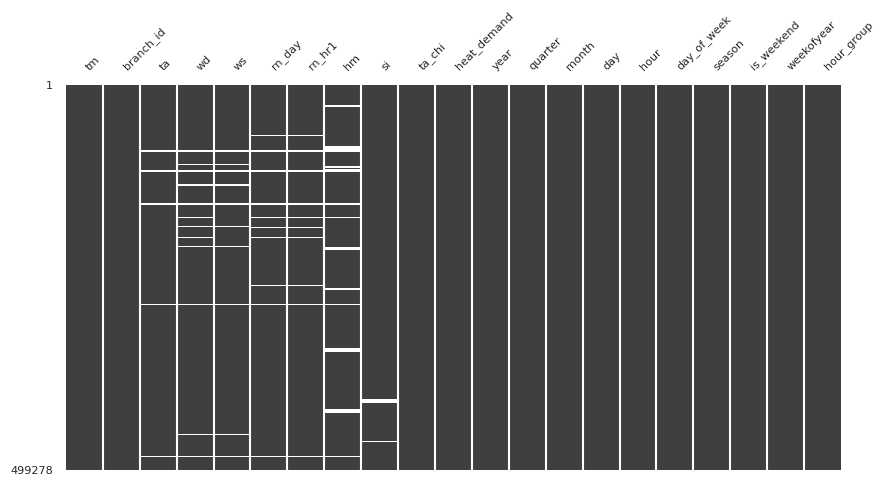

In [27]:
# 전체 결측치 matrix 시각화
fig, ax = plt.subplots(figsize=(10, 5))
msno.matrix(df_train,ax=ax)
ax.tick_params(axis='x', labelsize=8)
ax.tick_params(axis='y', labelsize=8)
plt.show()

In [28]:
# 풍향 sin, cos 변환
df_train['wd_rad'] = np.deg2rad(df_train['wd'])  # 도 → 라디안 변환
df_train['wd_sin'] = np.sin(df_train['wd_rad'])
df_train['wd_cos'] = np.cos(df_train['wd_rad'])

In [29]:
df_train

,tm,branch_id,ta,wd,ws,rn_day,rn_hr1,hm,si,ta_chi,...,day,hour,day_of_week,season,is_weekend,weekofyear,hour_group,wd_rad,wd_sin,wd_cos
0,2021-01-01 01:00:00,A,-10.1,78.3,0.5,0.0,0.0,68.2,0.0,-8.2,...,1,1,4,Winter,Weekday,53,0,1.366593,9.792228e-01,0.202787
1,2021-01-01 02:00:00,A,-10.2,71.9,0.6,0.0,0.0,69.9,0.0,-8.6,...,1,2,4,Winter,Weekday,53,0,1.254892,9.505157e-01,0.310676
2,2021-01-01 03:00:00,A,-10.0,360.0,0.0,0.0,0.0,69.2,0.0,-8.8,...,1,3,4,Winter,Weekday,53,1,6.283185,-2.449294e-16,1.000000
3,2021-01-01 04:00:00,A,-9.3,155.9,0.5,0.0,0.0,65.0,0.0,-8.9,...,1,4,4,Winter,Weekday,53,1,2.720968,4.083305e-01,-0.912834
4,2021-01-01 05:00:00,A,-9.0,74.3,1.9,0.0,0.0,63.5,0.0,-9.2,...,1,5,4,Winter,Weekday,53,1,1.296780,9.626917e-01,0.270600
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
499273,2023-12-31 19:00:00,S,3.2,233.5,0.4,2.5,0.0,91.5,0.0,2.8,...,31,19,6,Winter,Weekend,52,6,4.075344,-8.038569e-01,-0.594823
499274,2023-12-31 20:00:00,S,2.9,227.4,0.1,2.5,0.0,92.1,0.0,2.7,...,31,20,6,Winter,Weekend,52,6,3.968879,-7.360971e-01,-0.676876
499275,2023-12-31 21:00:00,S,2.1,360.0,0.0,2.5,0.0,93.3,0.0,1.4,...,31,21,6,Winter,Weekend,52,7,6.283185,-2.449294e-16,1.000000
499276,2023-12-31 22:00:00,S,2.2,30.0,1.4,2.5,0.0,95.5,0.0,1.3,...,31,22,6,Winter,Weekend,52,7,0.523599,5.000000e-01,0.866025


# **2. EDA**

Cluster 0: ['E', 'F', 'I', 'J', 'K', 'N', 'O', 'Q']

Cluster 1: ['B', 'C', 'G']

Cluster 2: ['A', 'D', 'H', 'P']

Cluster 3: ['L', 'M', 'R', 'S']

## **2-0. cluster 0**

### **0) 데이터 확인하기**

In [30]:
cluster0_branch_ids = ['E', 'F', 'I', 'J', 'K', 'N', 'O', 'Q']
df_train_cluster0 = df_train[df_train['branch_id'].isin(cluster0_branch_ids)]

In [31]:
df_train_cluster0.head()

,tm,branch_id,ta,wd,ws,rn_day,rn_hr1,hm,si,ta_chi,...,day,hour,day_of_week,season,is_weekend,weekofyear,hour_group,wd_rad,wd_sin,wd_cos
105112,2021-01-01 01:00:00,E,-7.0,282.3,0.9,0.0,0.0,NaN,0.0,-8.1,...,1,1,4,Winter,Weekday,53,0,4.927064,-0.977046,0.213030
105113,2021-01-01 02:00:00,E,-8.4,152.9,0.7,0.0,0.0,NaN,0.0,-9.2,...,1,2,4,Winter,Weekday,53,0,2.668608,0.455545,-0.890213
105114,2021-01-01 03:00:00,E,-8.9,167.2,0.4,0.0,0.0,NaN,0.0,-9.8,...,1,3,4,Winter,Weekday,53,1,2.918191,0.221548,-0.975149
105115,2021-01-01 04:00:00,E,-8.5,271.5,0.4,0.0,0.0,NaN,0.0,-9.8,...,1,4,4,Winter,Weekday,53,1,4.738569,-0.999657,0.026177
105116,2021-01-01 05:00:00,E,-9.7,189.6,0.4,0.0,0.0,NaN,0.0,-10.4,...,1,5,4,Winter,Weekday,53,1,3.309144,-0.166769,-0.985996


In [32]:
df_train_cluster0.shape # 12개의 열, 10999개의 행

(210218, 24)

In [33]:
df_train_cluster0.describe()

,tm,ta,wd,ws,rn_day,rn_hr1,hm,si,ta_chi,heat_demand,...,quarter,month,day,hour,day_of_week,weekofyear,hour_group,wd_rad,wd_sin,wd_cos
count,210218,202445.000000,200065.000000,200115.000000,200352.000000,200161.000000,182522.000000,210050.000000,210199.000000,210218.000000,...,210218.000000,210218.000000,210218.000000,210218.000000,210218.000000,210218.0,210218.000000,200065.000000,200065.000000,200065.000000
mean,2022-07-02 12:09:15.760210944,13.165004,216.068185,1.347934,1.875330,0.151147,64.682089,0.603642,13.634465,69.160529,...,2.509642,6.526216,15.721223,11.500885,3.005428,26.571545,3.500285,3.771101,-0.154408,0.085242
min,2021-01-01 01:00:00,-19.700000,0.000000,0.000000,0.000000,0.000000,2.500000,0.000000,-24.700000,0.000000,...,1.000000,1.000000,1.000000,0.000000,0.000000,1.0,0.000000,0.000000,-1.000000,-1.000000
25%,2021-10-01 19:00:00,4.600000,130.800000,0.500000,0.000000,0.000000,48.900000,0.000000,4.100000,29.000000,...,2.000000,4.000000,8.000000,6.000000,1.000000,14.0,2.000000,2.282891,-0.874620,-0.553392
50%,2022-07-02 12:30:00,14.300000,242.700000,1.100000,0.000000,0.000000,65.800000,0.010000,14.800000,52.000000,...,3.000000,7.000000,16.000000,12.000000,3.000000,27.0,4.000000,4.235914,-0.201078,0.118404
75%,2023-04-02 06:00:00,22.400000,300.200000,2.000000,0.000000,0.000000,82.200000,1.020000,24.200000,96.000000,...,4.000000,10.000000,23.000000,18.000000,5.000000,40.0,6.000000,5.239478,0.510543,0.770513
max,2023-12-31 23:00:00,37.200000,360.000000,9.600000,276.000000,91.500000,100.000000,3.920000,36.700000,365.000000,...,4.000000,12.000000,31.000000,23.000000,6.000000,53.0,7.000000,6.283185,1.000000,1.000000
std,NaN,10.998412,104.414911,1.103621,9.725293,1.207923,20.960806,0.901373,12.001680,52.683465,...,1.116769,3.447814,8.796031,6.921937,2.000484,15.051291,2.291221,1.822384,0.701330,0.690675


In [34]:
df_train_cluster0.info()

<class 'pandas.core.frame.DataFrame'>
Index: 210218 entries, 105112 to 446723
Data columns (total 24 columns):
 #   Column       Non-Null Count   Dtype         
---  ------       --------------   -----         
 0   tm           210218 non-null  datetime64[ns]
 1   branch_id    210218 non-null  object        
 2   ta           202445 non-null  float64       
 3   wd           200065 non-null  float64       
 4   ws           200115 non-null  float64       
 5   rn_day       200352 non-null  float64       
 6   rn_hr1       200161 non-null  float64       
 7   hm           182522 non-null  float64       
 8   si           210050 non-null  float64       
 9   ta_chi       210199 non-null  float64       
 10  heat_demand  210218 non-null  float64       
 11  year         210218 non-null  int32         
 12  quarter      210218 non-null  int32         
 13  month        210218 non-null  int32         
 14  day          210218 non-null  int32         
 15  hour         210218 non-null  int3

In [35]:
# 결측치 확인
missing_df = pd.DataFrame({
    'Missing Count': df_train_cluster0.isnull().sum(),
    'Missing Ratio (%)': df_train_cluster0.isnull().mean() * 100
})

# 결측치가 있는 열만 추출
missing_df = missing_df[missing_df['Missing Count'] > 0].sort_values(by='Missing Count', ascending=False)
print(missing_df)

        Missing Count  Missing Ratio (%)
hm              27696          13.174895
wd_cos          10153           4.829748
wd              10153           4.829748
wd_sin          10153           4.829748
wd_rad          10153           4.829748
ws              10103           4.805963
rn_hr1          10057           4.784081
rn_day           9866           4.693223
ta               7773           3.697590
si                168           0.079917
ta_chi             19           0.009038


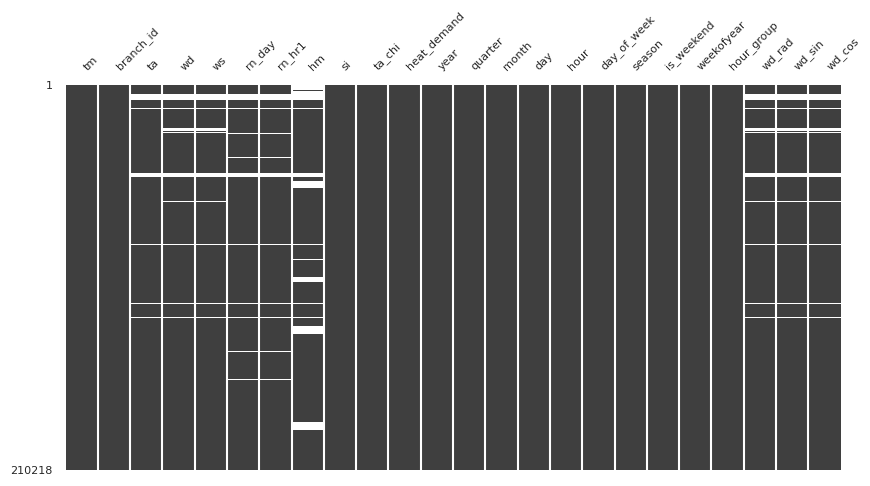

In [36]:
# 전체 결측치 matrix 시각화
fig, ax = plt.subplots(figsize=(10, 5))
msno.matrix(df_train_cluster0,ax=ax)
ax.tick_params(axis='x', labelsize=8)
ax.tick_params(axis='y', labelsize=8)
plt.show()

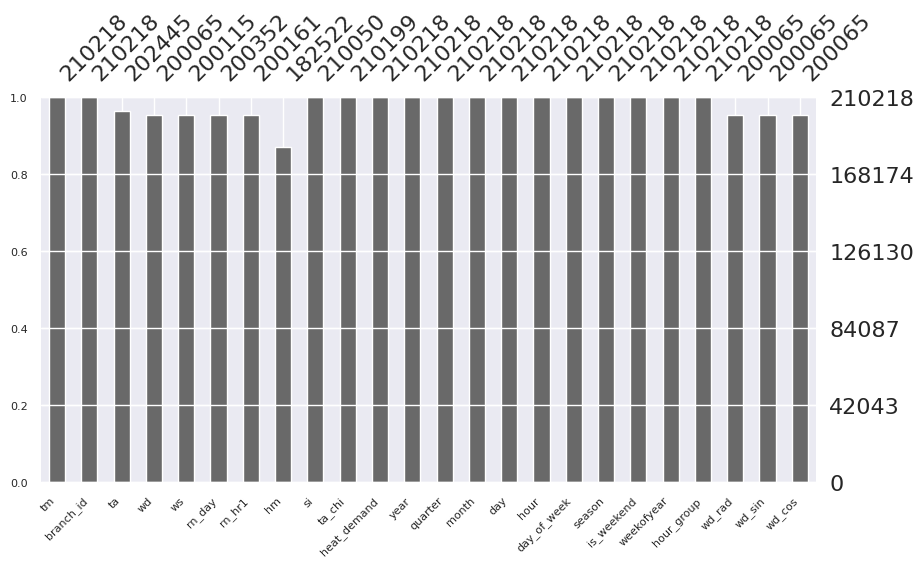

In [37]:
# 막대그래프 형태로 시각화
fig, ax = plt.subplots(figsize=(10, 5))
msno.bar(df_train_cluster0, ax=ax)
ax.tick_params(axis='x', labelsize=8)
ax.tick_params(axis='y', labelsize=8)
plt.show()

### **1) Target 분석**

##### **(1) 일별 열수요 평균**

In [38]:
daily_avg_df_cluster0 = (
    df_train_cluster0.copy()
    .assign(date=lambda x: x['tm'].dt.date)
    .groupby('date')['heat_demand']
    .mean()
)

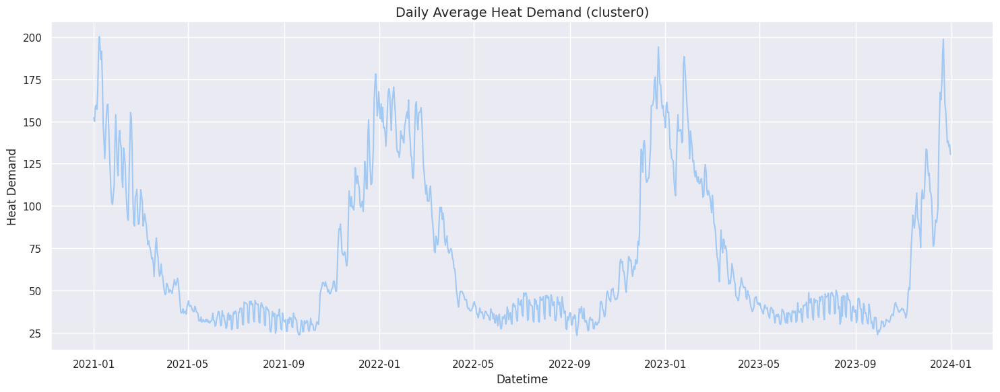

In [39]:
# 시도표
plt.figure(figsize=(15, 6))
plt.plot(daily_avg_df_cluster0.index, daily_avg_df_cluster0.values)
plt.title('Daily Average Heat Demand (cluster0)', fontsize=14)
plt.xlabel('Datetime', fontsize=12)
plt.ylabel('Heat Demand', fontsize=12)
plt.grid(True)
plt.tight_layout()
plt.show()

##### **(2) 분포 시각화**

* 클러스터 내 전체 브랜치

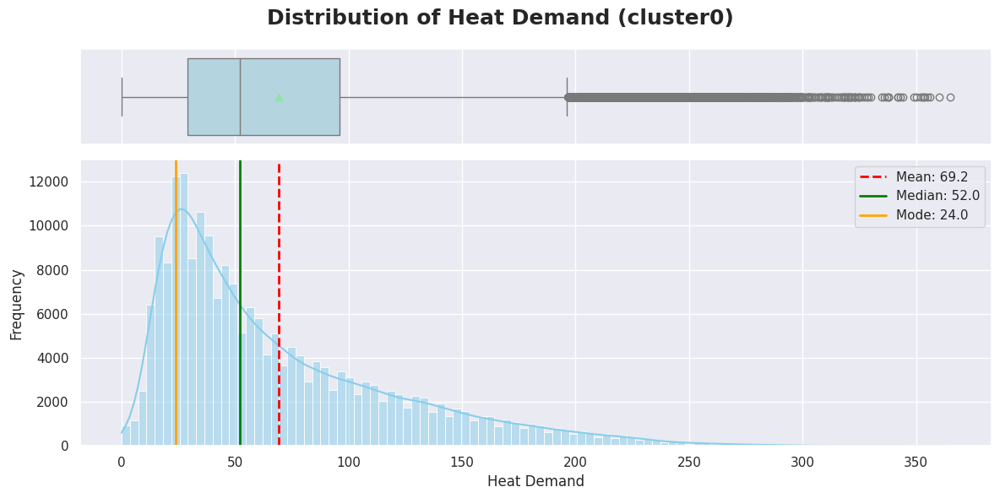

In [40]:
# 평균, 중앙값, 최빈값 계산
mean = df_train_cluster0['heat_demand'].mean()
median = df_train_cluster0['heat_demand'].median()
mode = df_train_cluster0['heat_demand'].mode()[0]

# 서브플롯 구성 (상단: 박스플롯 / 하단: 히스토그램+분포)
fig, (ax_box, ax_hist) = plt.subplots(
    2, 1,
    gridspec_kw={"height_ratios": (.25, .75)},
    figsize=(12, 6),
    sharex=True
)

fig.suptitle("Distribution of Heat Demand (cluster0)", fontsize=18, fontweight='bold')

# (1) Boxplot
sns.boxplot(
    x=df_train_cluster0['heat_demand'],
    showmeans=True,
    orient='h',
    color='lightblue',
    ax=ax_box
)
ax_box.set(xlabel='')

# (2) Histogram + 평균/중앙값/최빈값 선
sns.histplot(df_train_cluster0['heat_demand'], bins=100, kde=True, color='skyblue', ax=ax_hist)
ax_hist.axvline(mean, color='red', linestyle='--', linewidth=2, label=f'Mean: {mean:.1f}')
ax_hist.axvline(median, color='green', linestyle='-', linewidth=2, label=f'Median: {median:.1f}')
ax_hist.axvline(mode, color='orange', linestyle='-', linewidth=2, label=f'Mode: {mode:.1f}')

# 축 및 범례
ax_hist.set_xlabel('Heat Demand', fontsize=12)
ax_hist.set_ylabel('Frequency', fontsize=12)
ax_hist.grid(True)
ax_hist.legend()

plt.tight_layout()
plt.show()



> 오른쪽으로 꼬리가 긴 분포를 가지며, 비대칭적인 분포를 보임 -> 분포의 왜도를 줄일 수 있는 **로그 변환, 또는 Box-Cox 변환**을 고려하자!



* 이상치 파악해보기

In [ ]:
# 이상치 기준 설정
threshold = 350

# 이상치 탐색
outliers = df_train_cluster0[df_train_cluster0['heat_demand'] >= threshold]

# 결과 출력
outliers.sort_values('heat_demand', ascending=False)

,tm,branch_id,ta,wd,ws,rn_day,rn_hr1,hm,si,ta_chi,...,year,quarter,month,day,hour,day_of_week,season,is_weekend,weekofyear,hour_group
341797,2021-01-08 21:00:00,N,-10.0,245.8,2.4,0.0,0.0,NaN,0.0,-9.9,...,2021,1,1,8,21,4,Winter,Weekday,1,7
341796,2021-01-08 20:00:00,N,-9.8,221.2,2.7,0.0,0.0,NaN,0.0,-9.2,...,2021,1,1,8,20,4,Winter,Weekday,1,6
341798,2021-01-08 22:00:00,N,-10.3,290.2,1.2,0.0,0.0,NaN,0.0,-10.8,...,2021,1,1,8,22,4,Winter,Weekday,1,7
341773,2021-01-07 21:00:00,N,-12.1,263.1,2.4,0.0,0.0,NaN,0.0,-14.4,...,2021,1,1,7,21,3,Winter,Weekday,1,7
341774,2021-01-07 22:00:00,N,-12.5,267.7,2.3,0.0,0.0,NaN,0.0,-11.6,...,2021,1,1,7,22,3,Winter,Weekday,1,7
359773,2023-01-27 21:00:00,N,-6.0,118.8,1.6,0.0,0.0,39.9,0.0,-5.1,...,2023,1,1,27,21,4,Winter,Weekday,4,7
341821,2021-01-09 21:00:00,N,-7.8,307.1,1.9,0.0,0.0,NaN,0.0,-10.6,...,2021,1,1,9,21,5,Winter,Weekend,1,7
341845,2021-01-10 21:00:00,N,-3.9,258.3,0.6,0.0,0.0,NaN,0.0,-5.9,...,2021,1,1,10,21,6,Winter,Weekend,1,7
341772,2021-01-07 20:00:00,N,-11.6,268.3,3.4,0.0,0.0,NaN,0.0,-14.9,...,2021,1,1,7,20,3,Winter,Weekday,1,6




> N 지역의 2021년도 1월 7일 ~ 10일 사이로, 연속된 날들인 것을 봤을 때 이상치는 아닌 거 같음. 그대로 둬도 괜찮겠다는 생각입니다.


* 로그 변환 후 분포 재시각화

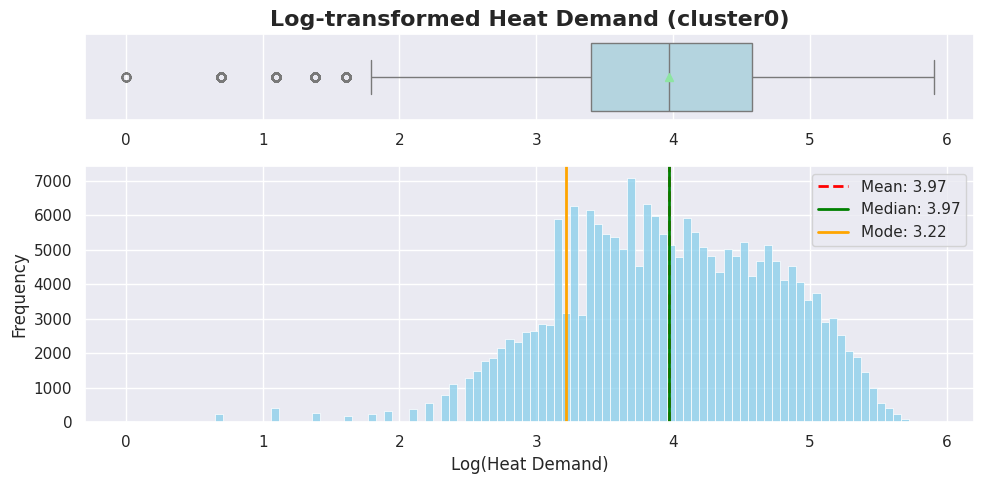

In [ ]:
df_train_cluster0['log_heat_demand'] = np.log1p(df_train_cluster0['heat_demand'])  # log(1 + x) 변환

# 시각화
fig, (ax_box, ax_dist) = plt.subplots(2, 1, gridspec_kw={"height_ratios": (.25, .75)}, figsize=(10, 5))

# 로그값에 대한 통계값
mean = df_train_cluster0['log_heat_demand'].mean()
median = df_train_cluster0['log_heat_demand'].median()
mode = df_train_cluster0['log_heat_demand'].mode().iloc[0]

# Boxplot
sns.boxplot(x=df_train_cluster0['log_heat_demand'], showmeans=True, orient='h', color='lightblue', ax=ax_box)
ax_box.set(xlabel='')
ax_box.set_title("Log-transformed Heat Demand (cluster0)", fontsize=16, fontweight='bold')

# Histogram
sns.histplot(df_train_cluster0['log_heat_demand'], bins=100, kde=False, ax=ax_dist, color='skyblue')
ax_dist.axvline(mean, color='red', linestyle='--', linewidth=2, label=f'Mean: {mean:.2f}')
ax_dist.axvline(median, color='green', linestyle='-', linewidth=2, label=f'Median: {median:.2f}')
ax_dist.axvline(mode, color='orange', linestyle='-', linewidth=2, label=f'Mode: {mode:.2f}')
ax_dist.set_xlabel('Log(Heat Demand)', fontsize=12)
ax_dist.set_ylabel('Frequency', fontsize=12)
ax_dist.legend()

plt.tight_layout()
plt.show()



> 로그 변환을 통해 열수요 분포의 왜도가 완화됨. 로그 변환 후에도 소수의 이상치가 보이지만, 이는 극단적인 열수요 부족(0 근처의 값들)인 값들을 로그변환 해서 0에 가까운 값이 나온 것으로 보임(이상치로 생각하지 않아도 될 것 같음)



* 각 브랜치별 분포 및 이상치

In [ ]:
def plot_heat_demand_distribution(df, column_name='heat_demand', title='Distribution of Heat Demand'):
    """
    데이터프레임과 컬럼명을 받아서 평균, 중앙값, 최빈값을 계산하고
    박스플롯과 히스토그램(분포)을 그리는 함수입니다.
    """
    mean = df[column_name].mean()
    median = df[column_name].median()
    mode = df[column_name].mode()[0]

    fig, (ax_box, ax_hist) = plt.subplots(
        2, 1,
        gridspec_kw={"height_ratios": (.25, .75)},
        figsize=(12, 6),
        sharex=True
    )

    fig.suptitle(title, fontsize=18, fontweight='bold')

    # 박스플롯
    sns.boxplot(
        x=df[column_name],
        showmeans=True,
        orient='h',
        color='lightblue',
        ax=ax_box
    )
    ax_box.set(xlabel='')

    # 히스토그램 + 평균/중앙값/최빈값 선
    sns.histplot(df[column_name], bins=100, kde=True, color='skyblue', ax=ax_hist)
    ax_hist.axvline(mean, color='red', linestyle='--', linewidth=2, label=f'Mean: {mean:.1f}')
    ax_hist.axvline(median, color='green', linestyle='-', linewidth=2, label=f'Median: {median:.1f}')
    ax_hist.axvline(mode, color='orange', linestyle='-', linewidth=2, label=f'Mode: {mode:.1f}')

    ax_hist.set_xlabel(column_name, fontsize=12)
    ax_hist.set_ylabel('Frequency', fontsize=12)
    ax_hist.grid(True)
    ax_hist.legend()

    plt.tight_layout()
    plt.show()

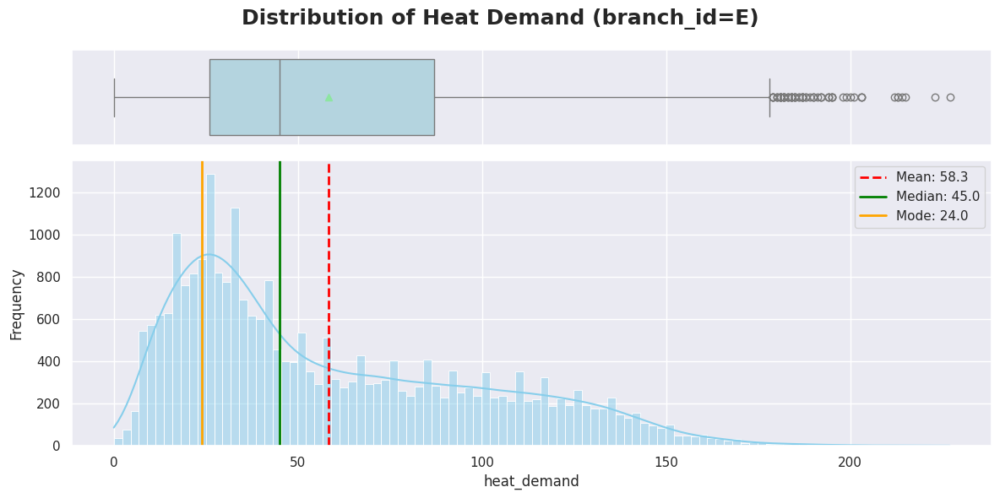

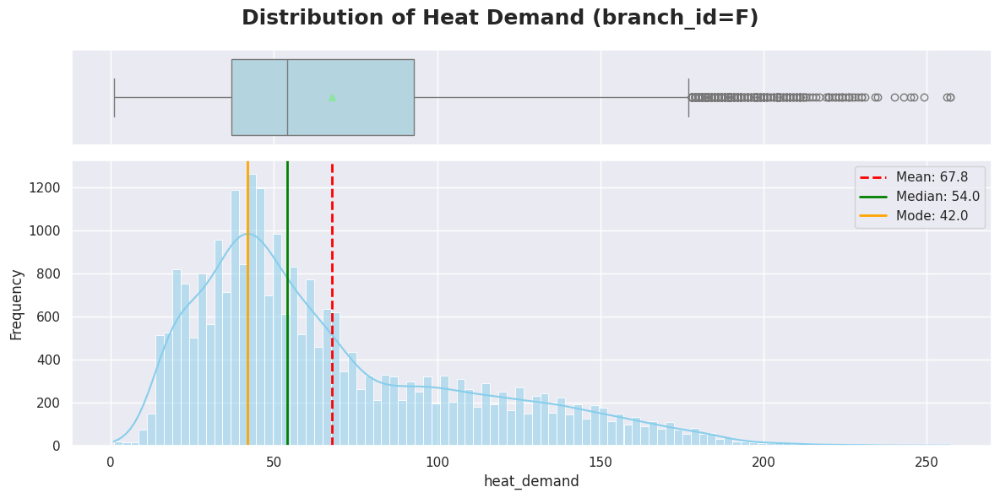

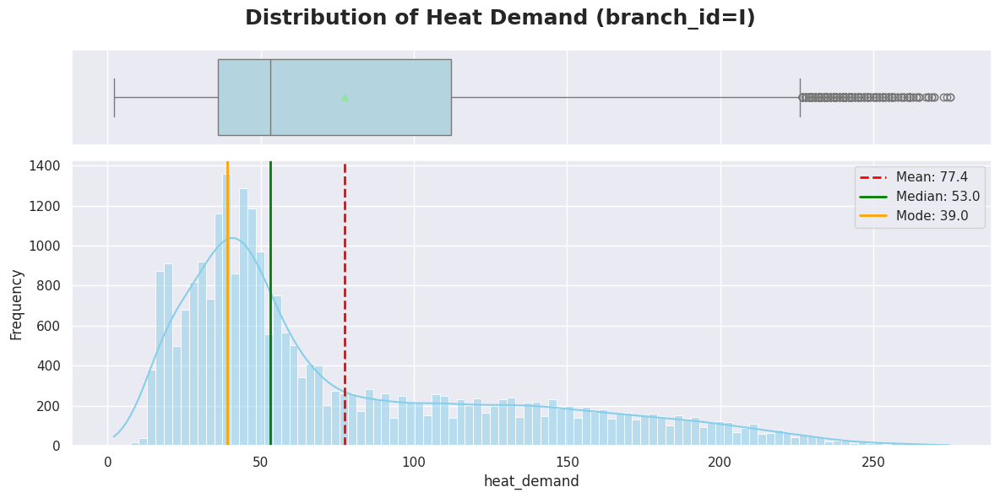

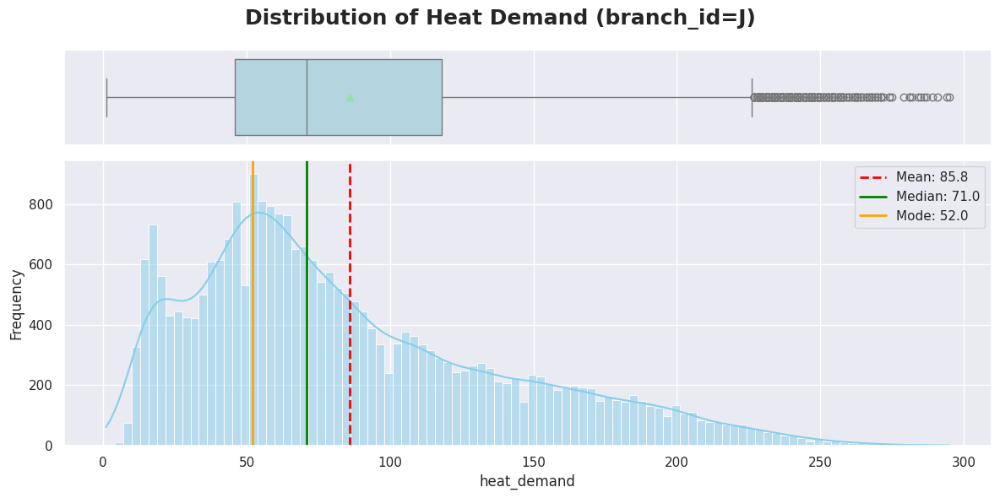

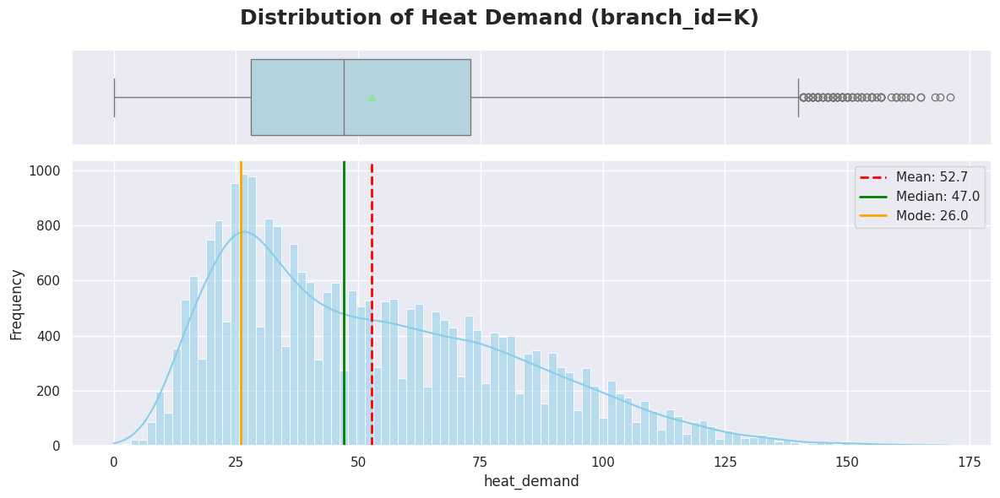

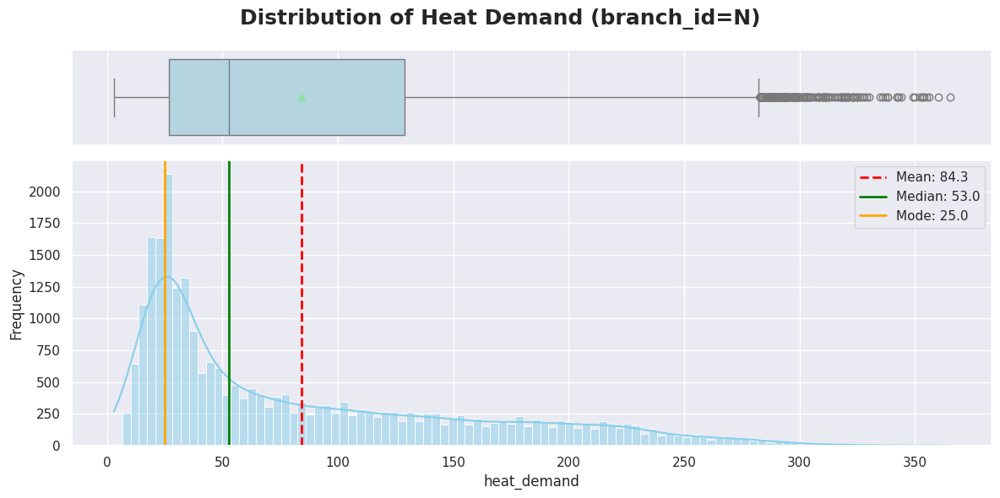

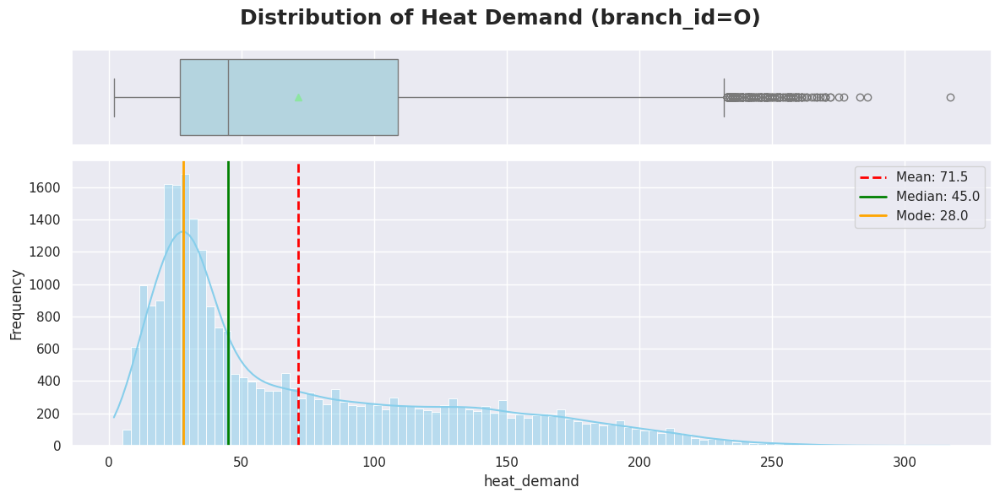

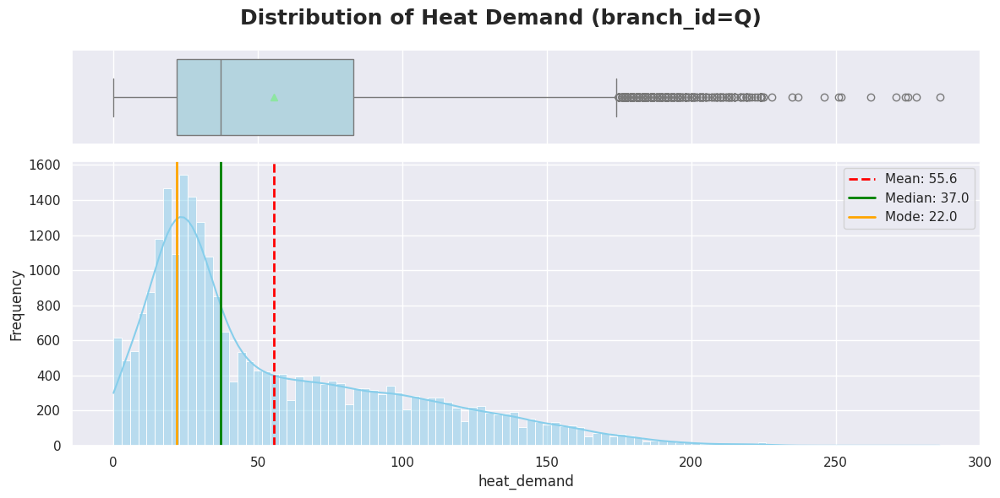

In [ ]:
# branch_id별로 분포 시각화
for branch in df_train_cluster0['branch_id'].unique():
    temp_df = df_train_cluster0[df_train_cluster0['branch_id'] == branch]
    plot_heat_demand_distribution(
        temp_df,
        column_name='heat_demand',
        title=f'Distribution of Heat Demand (branch_id={branch})'
    )

>  모든 지점에서 오른쪽으로 꼬리가 긴 비대칭 분포를 보임

>  Mode < Median < Mean 형태이며, 이는 대부분의 열수요가 낮은 값에 밀집되어 있고 소수의 매우 높은 수요가 평균값을 끌어올리고 있음을 의미함

>  특히 I, N, O 지점은 평균과 중앙값의 차이가 매우 큼. 고열수요 이상값의 영향이 크며, 일부 극단적인 수요가 전체 평균을 왜곡하고 있음.

>  E, K, Q 등은 낮은 수요가 집중되어 있고, 평균은 일부 높은 수요에 의해 소폭 상승한 상태임. 극단값 영향은 있으나 전체적으로는 중·저수요 중심의 분포임



##### **(3) STL 분해 / 정상성**

* STL 분해

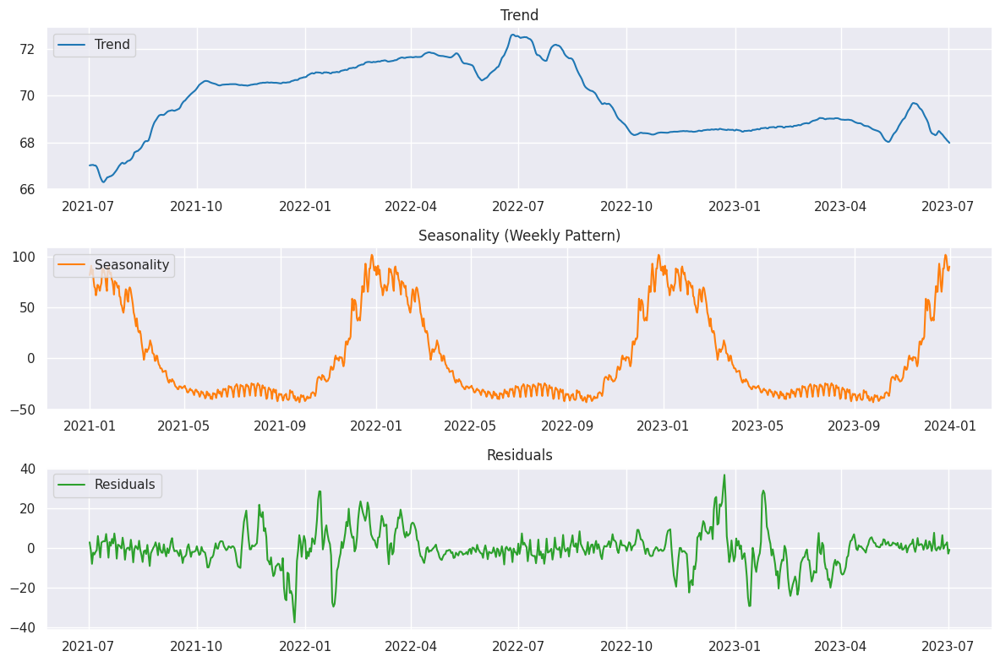

In [ ]:
# (1) 연단위 주기 파악
result = sm.tsa.seasonal_decompose(daily_avg_df_cluster0, model='additive', period=365)

colors = plt.cm.tab10.colors
plt.figure(figsize=(12, 8))

# Trend
plt.subplot(3, 1, 1)
plt.plot(result.trend, label='Trend', color=colors[0])
plt.title('Trend')
plt.legend(loc='upper left')

# Seasonality
plt.subplot(3, 1, 2)
plt.plot(result.seasonal, label='Seasonality', color=colors[1])
plt.title('Seasonality (Weekly Pattern)')
plt.legend(loc='upper left')

# Residuals
plt.subplot(3, 1, 3)
plt.plot(result.resid, label='Residuals', color=colors[2])
plt.title('Residuals')
plt.legend(loc='upper left')

plt.tight_layout()
plt.show()

> 명확한 연간 반복 패턴이 보임. 겨울철에 열수요가 급증, 여름철에는 급감

> 2022년 초, 2023년 초에 단기 이상값이 존재하나 전반적으로 잔차는 안정적임.

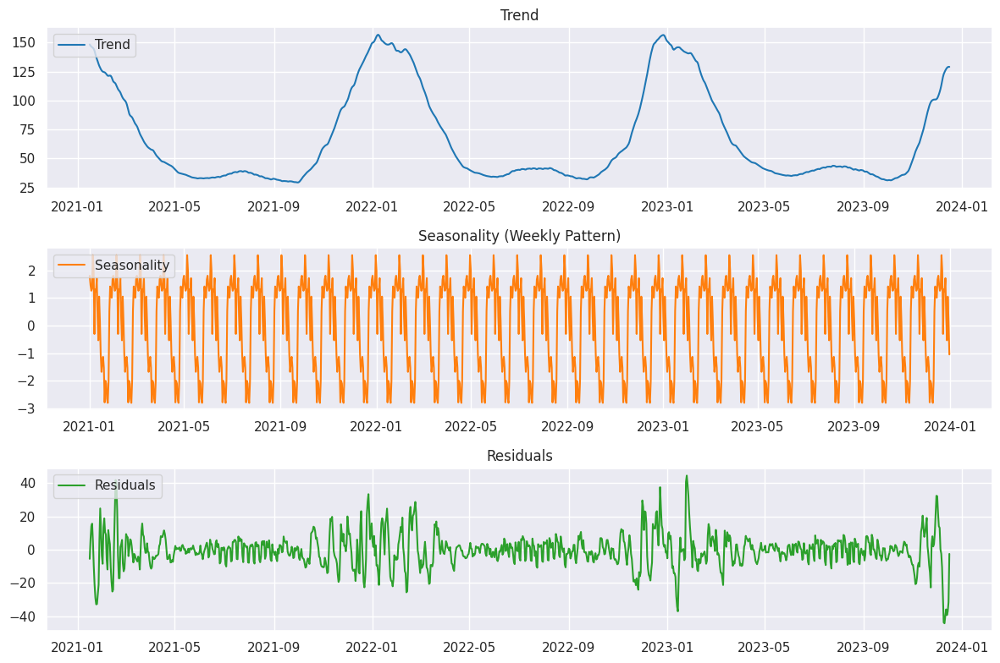

In [ ]:
#(2) 월단위 주기 파악악
result = sm.tsa.seasonal_decompose(daily_avg_df_cluster0, model='additive', period=30)

colors = plt.cm.tab10.colors
plt.figure(figsize=(12, 8))

# Trend
plt.subplot(3, 1, 1)
plt.plot(result.trend, label='Trend', color=colors[0])
plt.title('Trend')
plt.legend(loc='upper left')

# Seasonality
plt.subplot(3, 1, 2)
plt.plot(result.seasonal, label='Seasonality', color=colors[1])
plt.title('Seasonality (Weekly Pattern)')
plt.legend(loc='upper left')

# Residuals
plt.subplot(3, 1, 3)
plt.plot(result.resid, label='Residuals', color=colors[2])
plt.title('Residuals')
plt.legend(loc='upper left')

plt.tight_layout()
plt.show()

* 정상성

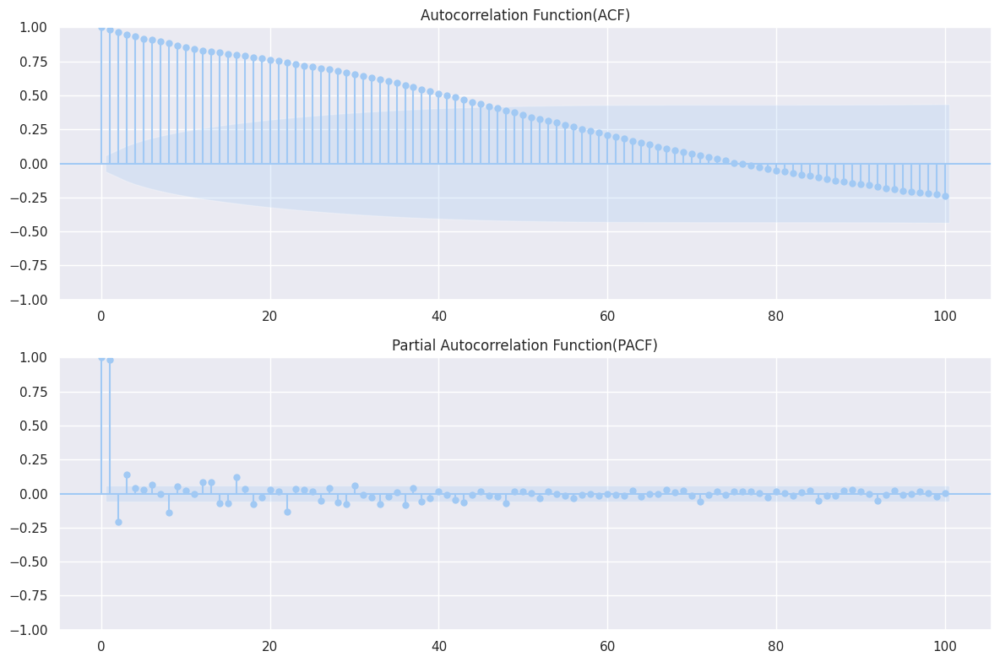

In [ ]:
fig, axes = plt.subplots(2, 1, figsize=(12, 8))

sm.graphics.tsa.plot_acf(daily_avg_df_cluster0, lags=100, ax=axes[0])
axes[0].set_title('Autocorrelation Function(ACF)')

sm.graphics.tsa.plot_pacf(daily_avg_df_cluster0, lags=100, ax=axes[1])
axes[1].set_title('Partial Autocorrelation Function(PACF)')

plt.tight_layout()
plt.show()

> ACF : 서서히 감소하는 형태로 계절성과 추세가 모두 존재하고 장기적인 자기 상관성이 존재함. (열수요가며칠 전 수요와 관련되는 것으로 보임)

> PACF :1~2시차에서 강한 지가 상관, 이후에는 급격히 감소하는 것으로 보임

##### **(3) 주별 / 월별 / 년도별 / 요일별 / 계절별 / 주말 여부 열수요 평균**

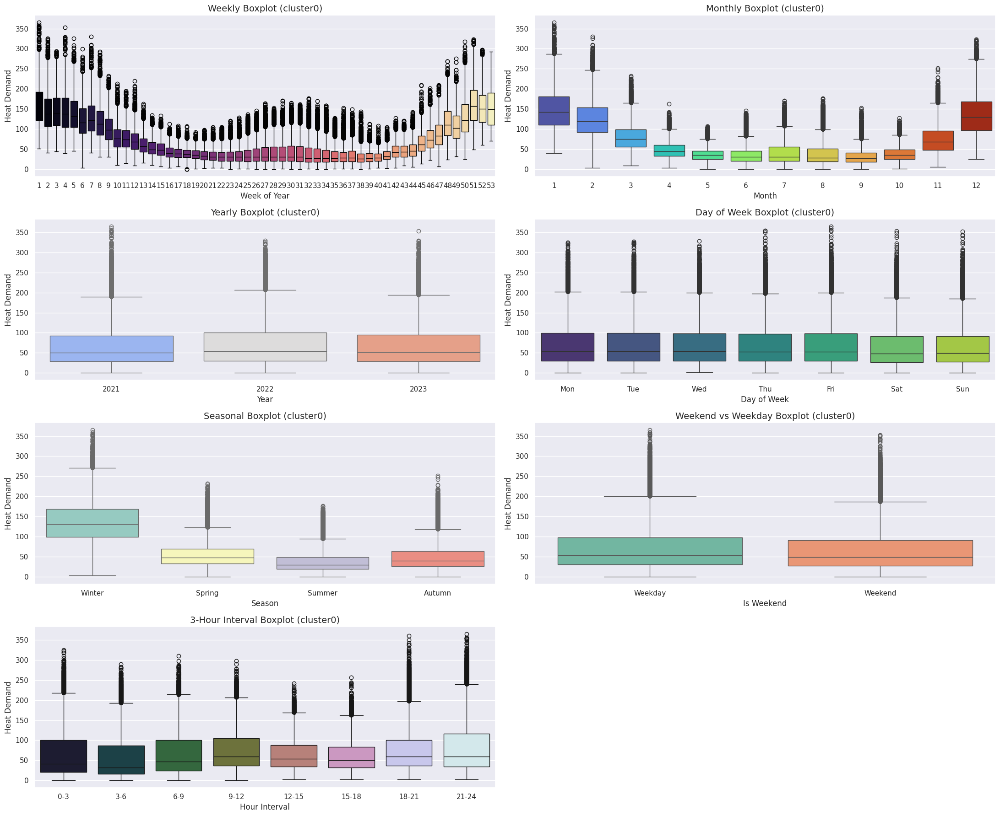

In [41]:
# 요일 이름 매핑
weekday_labels = ['Mon', 'Tue', 'Wed', 'Thu', 'Fri', 'Sat', 'Sun']

# 플롯 설정
fig, axes = plt.subplots(4, 2, figsize=(22, 18))
plt.subplots_adjust(hspace=0.4, wspace=0.2)

# 1. 주별
sns.boxplot(x='weekofyear', y='heat_demand', data=df_train_cluster0, ax=axes[0,0], palette='magma')
axes[0,0].set_title('Weekly Boxplot (cluster0)', fontsize=14)
axes[0,0].set_xlabel('Week of Year')
axes[0,0].set_ylabel('Heat Demand')

# 2. 월별
sns.boxplot(x='month', y='heat_demand', data=df_train_cluster0, ax=axes[0,1], palette='turbo')
axes[0,1].set_title('Monthly Boxplot (cluster0)', fontsize=14)
axes[0,1].set_xlabel('Month')
axes[0,1].set_ylabel('Heat Demand')

# 3. 연도별
sns.boxplot(x='year', y='heat_demand', data=df_train_cluster0, ax=axes[1,0], palette='coolwarm')
axes[1,0].set_title('Yearly Boxplot (cluster0)', fontsize=14)
axes[1,0].set_xlabel('Year')
axes[1,0].set_ylabel('Heat Demand')

# 4. 요일별
sns.boxplot(x='day_of_week', y='heat_demand', data=df_train_cluster0, ax=axes[1,1], palette='viridis')
axes[1,1].set_title('Day of Week Boxplot (cluster0)', fontsize=14)
axes[1,1].set_xlabel('Day of Week')
axes[1,1].set_ylabel('Heat Demand')
axes[1,1].set_xticklabels(weekday_labels)

# 5. 계절별
sns.boxplot(x='season', y='heat_demand', data=df_train_cluster0, ax=axes[2,0], palette='Set3')
axes[2,0].set_title('Seasonal Boxplot (cluster0)', fontsize=14)
axes[2,0].set_xlabel('Season')
axes[2,0].set_ylabel('Heat Demand')

# 6. 주말여부
sns.boxplot(x='is_weekend', y='heat_demand', data=df_train_cluster0, ax=axes[2,1], palette='Set2')
axes[2,1].set_title('Weekend vs Weekday Boxplot (cluster0)', fontsize=14)
axes[2,1].set_xlabel('Is Weekend')
axes[2,1].set_ylabel('Heat Demand')

# 7. 하루를 3시간 단위로 나눈 박스플롯
sns.boxplot(x='hour_group', y='heat_demand', data=df_train_cluster0, ax=axes[3,0], palette='cubehelix')
axes[3,0].set_title('3-Hour Interval Boxplot (cluster0)', fontsize=14)
axes[3,0].set_xlabel('Hour Interval')
axes[3,0].set_ylabel('Heat Demand')
axes[3,0].set_xticklabels(hour_labels)

axes[3,1].axis('off')  # 일단 비워둠

plt.tight_layout()
plt.show()



> Weekly : 1 ~ 8 주와 48 ~ 53 주에 열수요가 매우 높고 여름철인 20~35주 사이에 열수요가 뚜렷하게 낮다. 또한, 이 시기에 분산의 크기도 크다. 이는 계절에 따라 난방 수요가 반영된 패턴임을 알 수 있음 (겨울철 수요 증가, 여름철 수요 감소)

> Monthly : 1, 2, 11, 12월에 수요가 높고, 6~9월에 가장 낮음.


> Yearly,Day of week, 주말 여부 : 뚜렷한 차이 없음

> Seasonal : 겨울은 수요 중앙값이 크고 변동성도 큼. Monthly와 비슷한 경향

> 3시간 단위 : 9-12가 가장 높음


* 계절별 시간대별 (3시간 간격) Boxplot

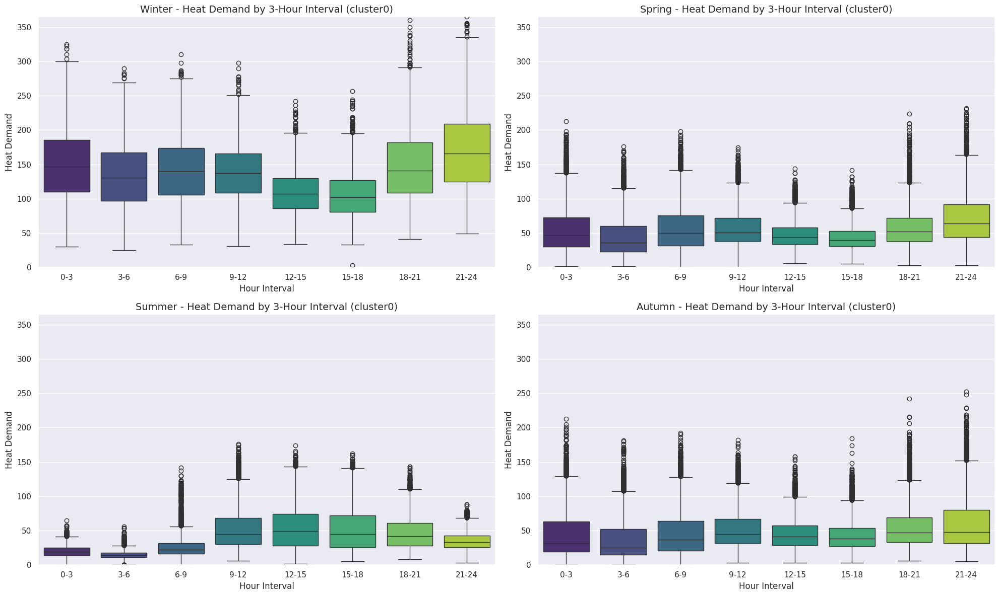

In [ ]:
# 3시간 단위 시간 그룹 레이블
hour_labels = ['0-3', '3-6', '6-9', '9-12', '12-15', '15-18', '18-21', '21-24']
df_train_cluster0['hour_group'] = (df_train_cluster0['tm'].dt.hour // 3).astype(int)

# 계절 순서 고정
season_order = ['Winter', 'Spring', 'Summer', 'Autumn']

# 공통 y축 범위 지정
y_min = 0
y_max = df_train_cluster0['heat_demand'].max()

# 시각화
plt.figure(figsize=(20, 12))
for i, season in enumerate(season_order):
    plt.subplot(2, 2, i+1)
    subset = df_train_cluster0[df_train_cluster0['season'] == season]
    sns.boxplot(x='hour_group', y='heat_demand', data=subset, palette='viridis')
    plt.title(f'{season} - Heat Demand by 3-Hour Interval (cluster0)', fontsize=14)
    plt.xlabel('Hour Interval')
    plt.ylabel('Heat Demand')
    plt.xticks(ticks=range(8), labels=hour_labels)
    plt.ylim(y_min, y_max)  # Y축 고정

plt.tight_layout()
plt.show()


> winter: 전 시간대에서 열수요가 전반적으로 높으며, 특히 0-3시, 18-21시, 21-24시 구간에서 수요가 가장 높다. 이는 특히 온도가 낮은 저녁, 밤 시간대의 영향인 것으로 보인다.(겨울철 야간 냉기가 강한 지역일수도)

> spring, autumn : 전반적으로 수요는 낮지만, 21–24시 구간에서 다시 증가  → 일교차 큰 계절에 밤에만 난방 수요 발생하는게 아닐까?


> **summer** : 전체 수요는 가장 낮지만, 낮 시간대(9–12시, 12–15시)에 수요가 상대적으로 높음. → 일반 건물에서 난방 수요가 적은 시기이므로, 다음과 같은 가능성이 존재: (1) 산업/상업 부문의 공정용 열수요: 공장 가동 시 사용되는 증기/열교환 시스템 등 (2) 냉방 보조 시스템 수요: 예를 들어 흡수식 냉방기는 여름 냉방을 위해 열을 소모함. 낮에 냉방 피크가 몰리므로 열수요도 동반 상승했을 가능

=> 여름철 고려

* 여름 시간대 지사별 비교

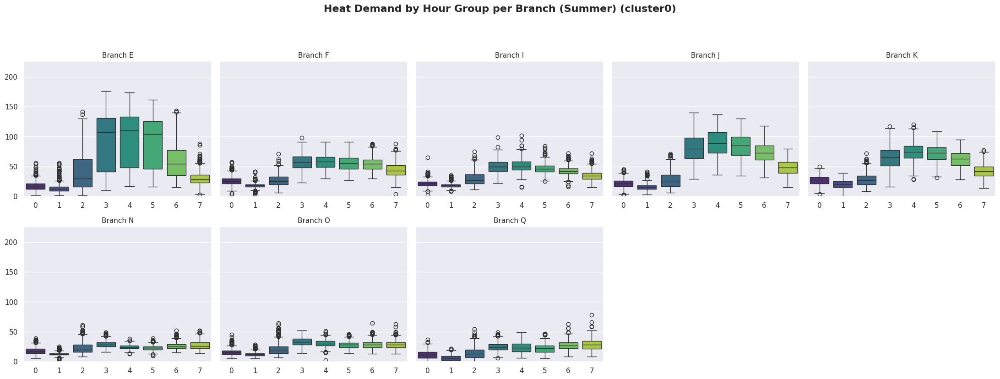

In [ ]:
# 여름철 데이터 필터링
summer_df = df_train_cluster0[df_train_cluster0['month'].isin([6, 7, 8])]

# 브랜치 정렬
branches = sorted(summer_df['branch_id'].unique())
n_branches = len(branches)

# 공통 y축 범위 설정
y_min = summer_df['heat_demand'].min()
y_max = summer_df['heat_demand'].max() + 50

# subplot 설정
n_rows, n_cols = 4, 5
fig, axes = plt.subplots(n_rows, n_cols, figsize=(22, 16), sharey=True)  # sharey로 Y축 일치
axes = axes.flatten()

# 각 지점에 대해 boxplot 그리기
for i, branch in enumerate(branches):
    ax = axes[i]
    branch_df = summer_df[summer_df['branch_id'] == branch]
    sns.boxplot(data=branch_df, x='hour_group', y='heat_demand', ax=ax, palette='viridis')
    ax.set_title(f'Branch {branch}', fontsize=11)
    ax.set_xlabel('')
    ax.set_ylabel('')
    ax.set_ylim(y_min, y_max)  # 모든 서브플롯에 동일한 y축 설정

# 남는 subplot은 비활성화
for j in range(len(branches), len(axes)):
    fig.delaxes(axes[j])

# 전체 레이아웃 조정
plt.suptitle('Heat Demand by Hour Group per Branch (Summer) (cluster0)', fontsize=16, fontweight='bold')
plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()



> Cluster 0에 속한 지사들은 여름철에도 일정 수준 이상의 열수요를 보이는 특징이 있다. 시간대별 수요 분포는 지사마다 뚜렷하게 다르며, 열 사용 패턴이 다양하게 나타난다.

> 일부 지사(E, J, 넓게보면 K까지)는 **낮 시간대(9~18시)**에 열수요가 집중되는 뚜렷한 피크를 보인다. -> 해당 지역이 상업시설 밀집 지역이거나 학교, 관공서, 병원 등 공공 기능이 많은 지역일 수 있음.(이 경우에는 상업시설 밀집 지역이거나 공공 기능이 많은 지역일 수 있음) 아니면, 다른 지역보다 기온이 높지는 않지만 습도가 높은 지형일수도(그러면 냉방 대신 온수 사용 등으로 보일러를 켜는 경우가 있음)

> N, O, Q 지사는 여름철 전반적으로 열 사용량이 매우 낮아 비활성에 가까운 모습을 보인다. (낮의 사용량이 클러스터 내 다른 브랜치에 비해 적은 편이다.)


<Axes: xlabel='branch_id'>

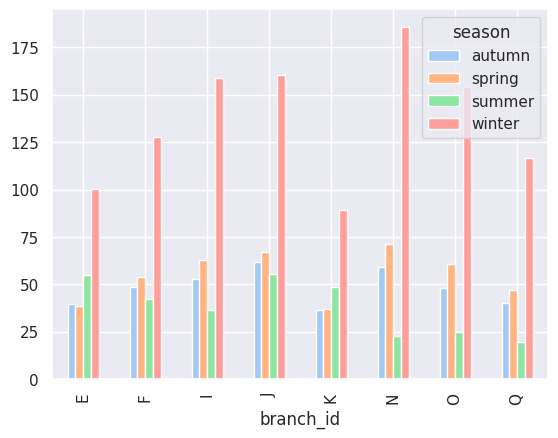

In [48]:
# 계절 구분: 1=봄, 2=여름, 3=가을, 4=겨울
df_train_cluster0['season'] = df_train_cluster0['tm'].dt.month % 12 // 3 + 1

# 숫자 계절을 문자로 매핑
season_map = {
    1: 'winter',
    2: 'spring',
    3: 'summer',
    4: 'autumn'
}
df_train_cluster0['season'] = df_train_cluster0['season'].map(season_map)

# 지사별, 계절별 평균 열수요 시각화
df_train_cluster0.groupby(['branch_id', 'season'])['heat_demand'].mean().unstack().plot(kind='bar')

> 전반적으로 겨울(winter) > 봄(spring) > 가을(autumn) > 여름(summer) 순으로 열수요가 높음

> 하지만, 지점별 차이가 큼. N, O, Q는 여름철 수요가 매우 작음. J, Q는 여름철 수요가 큰 편 (위의 시각화와 같은 결과)

> 특이 패턴 : K, E는 여름이 더 크며, J는 여름이 더 크진 않지만 타 지점에 비해 봄, 가을과 격차가 작은편

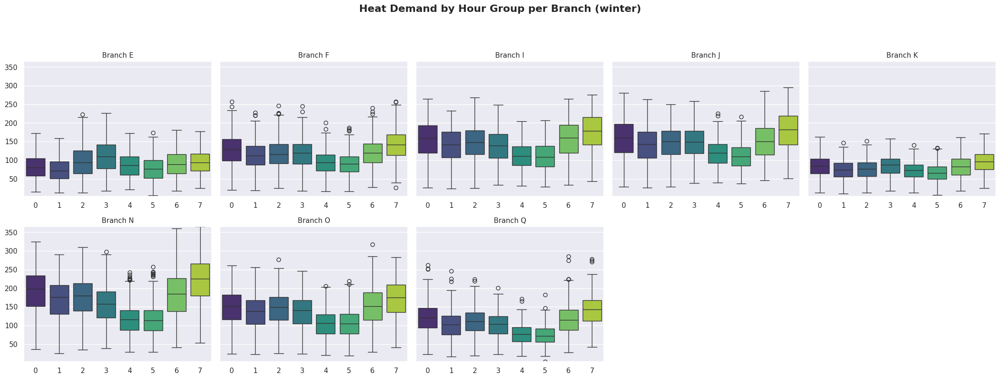

In [49]:
# 겨울철 데이터 필터링
winter_df = df_train_cluster0[df_train_cluster0['month'].isin([11,12,1,2])]

# 브랜치 정렬
branches = sorted(winter_df['branch_id'].unique())
n_branches = len(branches)

# 공통 y축 범위 설정 (예: 전체 여름 데이터 기준 0 ~ 200으로)
y_min = winter_df['heat_demand'].min()
y_max = winter_df['heat_demand'].max()

# subplot 설정
n_rows, n_cols = 4, 5
fig, axes = plt.subplots(n_rows, n_cols, figsize=(22, 16), sharey=True)  # sharey로 Y축 일치
axes = axes.flatten()

# 각 지점에 대해 boxplot 그리기
for i, branch in enumerate(branches):
    ax = axes[i]
    branch_df = winter_df[winter_df['branch_id'] == branch]
    sns.boxplot(data=branch_df, x='hour_group', y='heat_demand', ax=ax, palette='viridis')
    ax.set_title(f'Branch {branch}', fontsize=11)
    ax.set_xlabel('')
    ax.set_ylabel('')
    ax.set_ylim(y_min, y_max)  # 모든 서브플롯에 동일한 y축 설정

# 남는 subplot은 비활성화
for j in range(len(branches), len(axes)):
    fig.delaxes(axes[j])

# 전체 레이아웃 조정
plt.suptitle('Heat Demand by Hour Group per Branch (winter)', fontsize=16, fontweight='bold')
plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()

> N이 타지점에 비해 유독 겨울철 밤 시간대가 열 수요량이 높음

* 그렇다면 왜 K,E,J 지점의 여름철 열수요가 타 지점과 다르게 높을까?

    K, E, J는 여름철 열수요가 다른 계절에 비해 높은 편이며, 여름철 낮 시간대에 유독 높은 패턴을 보이고 있음. 대체 왜?!!?

    아이디어 : 습도 기반 불쾌감으로 온수 사용 증가가 아닐까..아니면 상업시설이나 병원과 같은 시설이 많아서? 근데 두번째는 우리가 파악할 수 없음.습도를 살피자!

In [69]:
df_train_cluster0.columns

Index(['tm', 'branch_id', 'ta', 'wd', 'ws', 'rn_day', 'rn_hr1', 'hm', 'si',
       'ta_chi', 'heat_demand', 'year', 'quarter', 'month', 'day', 'hour',
       'day_of_week', 'season', 'is_weekend', 'weekofyear', 'hour_group',
       'wd_rad', 'wd_sin', 'wd_cos'],
      dtype='object')

In [65]:
# 여름철 필터링
summer_df = df_train_cluster0[df_train_cluster0['season'] == 'summer']

z_min = summer_df['heat_demand'].min()
z_max = summer_df['heat_demand'].max()

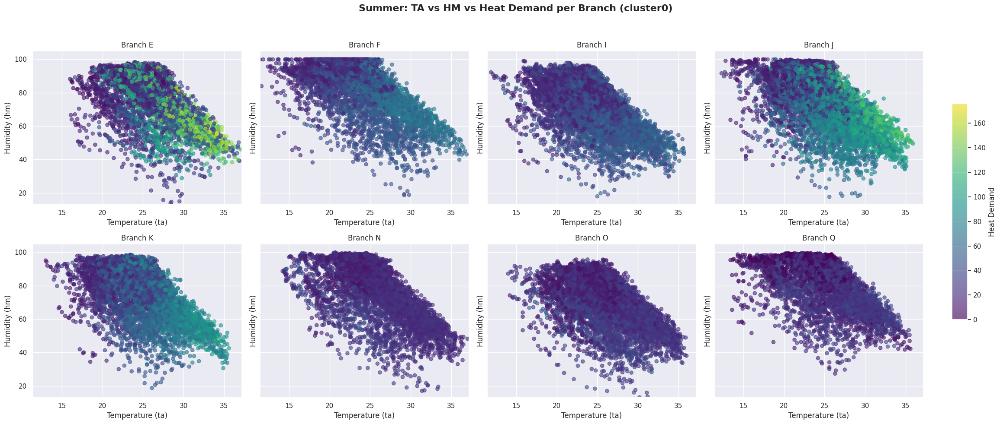

In [66]:
# 공통 범위 설정
x_min = summer_df['ta'].min()
x_max = summer_df['ta'].max()
y_min = summer_df['hm'].min()
y_max = summer_df['hm'].max()
branches = sorted(summer_df['branch_id'].unique())

# subplot 설정
n_rows, n_cols = 2, 4
fig, axes = plt.subplots(n_rows, n_cols, figsize=(24, 10), sharey=True)
axes = axes.flatten()

# 브랜치별 scatter plot
for i, branch in enumerate(branches):
    ax = axes[i]
    branch_df = summer_df[summer_df['branch_id'] == branch]
    sc = ax.scatter(branch_df['ta'], branch_df['hm'], c=branch_df['heat_demand'],
                    cmap='viridis', alpha=0.6, vmin=z_min, vmax=z_max)
    ax.set_title(f'Branch {branch}', fontsize=12)
    ax.set_xlabel('Temperature (ta)')
    ax.set_ylabel('Humidity (hm)')
    ax.set_xlim(x_min, x_max)
    ax.set_ylim(y_min, y_max + 5)

# 남는 subplot 제거
for j in range(len(branches), len(axes)):
    fig.delaxes(axes[j])

# 공통 colorbar 추가
cbar_ax = fig.add_axes([0.92, 0.25, 0.015, 0.5])
fig.colorbar(sc, cax=cbar_ax, label='Heat Demand')

# 전체 제목 및 레이아웃 정리
plt.suptitle('Summer: TA vs HM vs Heat Demand per Branch (cluster0)', fontsize=16, fontweight='bold')
plt.tight_layout(rect=[0, 0, 0.9, 0.95])
plt.show()

> E, J,K : 고온 + 중간습도에서 열수요가 집중. 이는 사람이 활동 중인 시간대 + 불쾌지수 상승 조건과 맞물림 급탕/생활열 사용, 혹은 환기 불량에 따른 냉방보완 목적의 보일러 사용 가능성 존재

>>  E: ta ≈ 28 ~ 33°C, hm ≈ 40 ~ 65%에서 노란색 → 높은 열수요

>> J: 유사하게 ta > 27도, hm ≈ 45~70%에서 수요 집중

>> K: E/J보단 약하지만, ta ≈ 25 ~ 33도, hm 40 ~ 70%에서 초록~노랑 분포


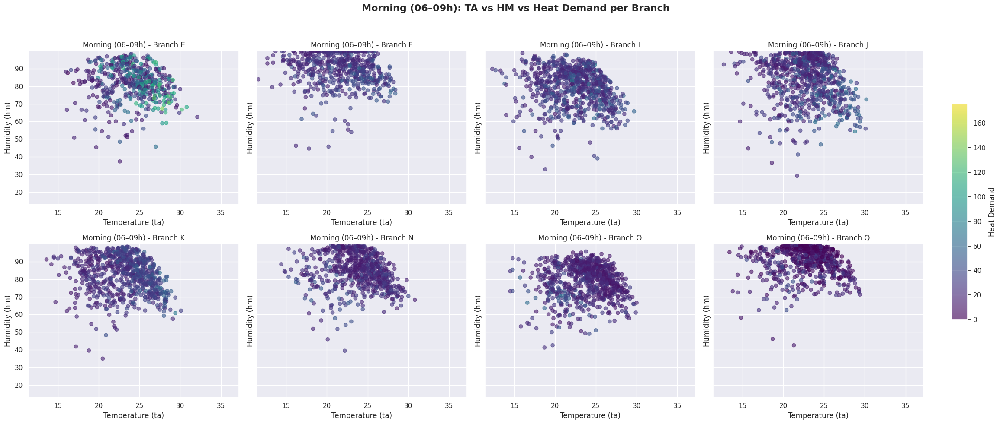

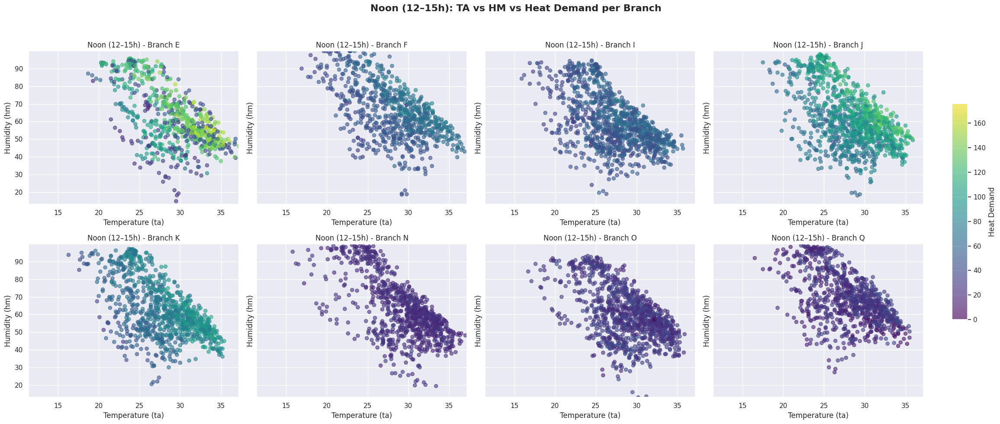

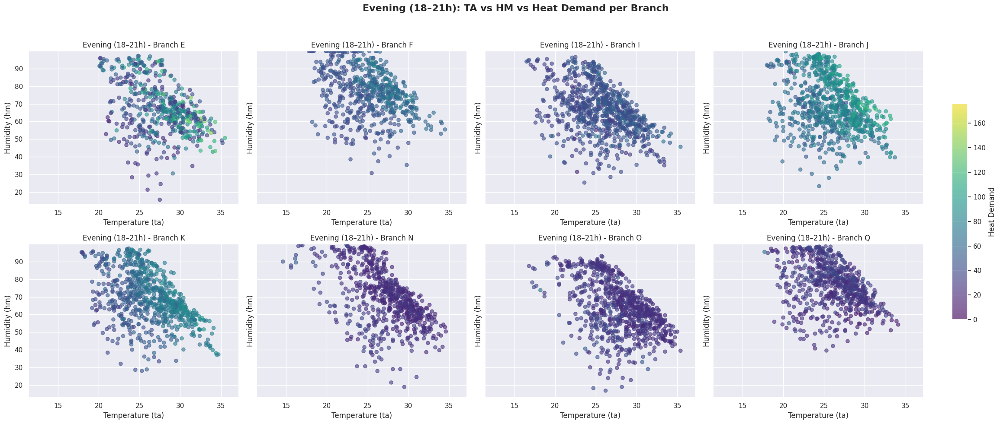

In [67]:
# 공통 z값 설정
z_min = summer_df['heat_demand'].min()
z_max = summer_df['heat_demand'].max()

def plot_ta_hm_heat_demand(df, title_suffix, z_min, z_max):
    branches = sorted(df['branch_id'].unique())
    x_min, x_max = summer_df['ta'].min(), summer_df['ta'].max()
    y_min, y_max = summer_df['hm'].min(), summer_df['hm'].max()

    fig, axes = plt.subplots(2, 4, figsize=(24, 10), sharey=True)
    axes = axes.flatten()

    for i, branch in enumerate(branches):
        ax = axes[i]
        branch_df = df[df['branch_id'] == branch]
        sc = ax.scatter(branch_df['ta'], branch_df['hm'], c=branch_df['heat_demand'],
                        cmap='viridis', alpha=0.6, vmin=z_min, vmax=z_max)
        ax.set_title(f'{title_suffix} - Branch {branch}')
        ax.set_xlim(x_min, x_max)
        ax.set_ylim(y_min, y_max)
        ax.set_xlabel('Temperature (ta)')
        ax.set_ylabel('Humidity (hm)')

    for j in range(len(branches), len(axes)):
        fig.delaxes(axes[j])

    cbar_ax = fig.add_axes([0.92, 0.25, 0.015, 0.5])
    fig.colorbar(sc, cax=cbar_ax, label='Heat Demand')

    plt.suptitle(f'{title_suffix}: TA vs HM vs Heat Demand per Branch', fontsize=16, fontweight='bold')
    plt.tight_layout(rect=[0, 0, 0.9, 0.95])
    plt.show()

plot_ta_hm_heat_demand(morning_df, "Morning (06–09h)", z_min, z_max)
plot_ta_hm_heat_demand(noon_df, "Noon (12–15h)", z_min, z_max)
plot_ta_hm_heat_demand(evening_df, "Evening (18–21h)", z_min, z_max)

낮 (12–15시) : E, J, K에서 뚜렷한 기온 상승과 습도 저하 구간(ta↑, hm↓)에서 수요 급증 → 불쾌지수 대응 수요 가능성.

이들 지점은 상업/공공 기능이 많은 지역일 가능성 있음 (업무 시간대 수요)

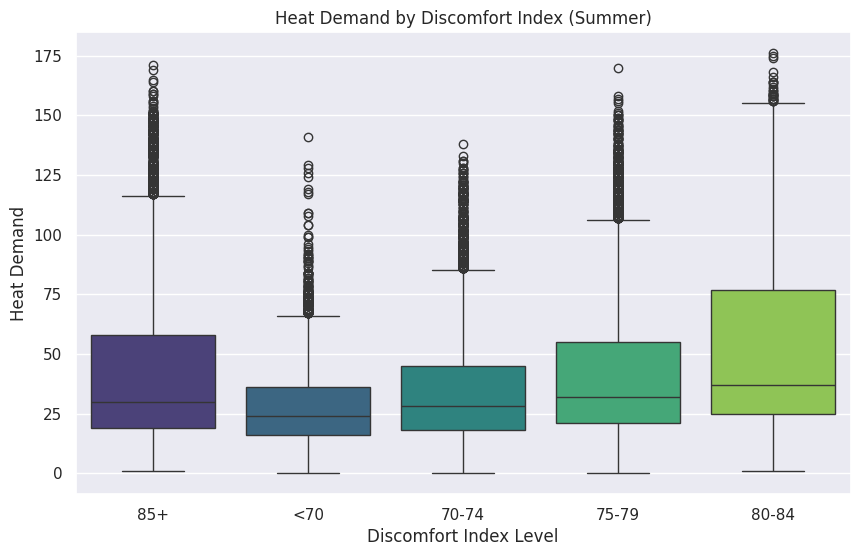

In [72]:
# 불쾌지수 계산
df_train_cluster0['DI'] = (
    0.81 * df_train_cluster0['ta'] +
    0.01 * df_train_cluster0['hm'] * (0.99 * df_train_cluster0['ta'] - 14.3) +
    46.3
)

# 구간별 불쾌지수 범주 설정
def di_level(di):
    if di < 70:
        return '<70'
    elif di < 75:
        return '70-74'
    elif di < 80:
        return '75-79'
    elif di < 85:
        return '80-84'
    else:
        return '85+'

df_train_cluster0['DI_level'] = df_train_cluster0['DI'].apply(di_level)

# 불쾌지수 구간별 열수요 분포 시각화
plt.figure(figsize=(10, 6))
sns.boxplot(data=df_train_cluster0[df_train_cluster0['month'].isin([6, 7, 8])],
            x='DI_level', y='heat_demand', palette='viridis')
plt.title('Heat Demand by Discomfort Index (Summer)')
plt.xlabel('Discomfort Index Level')
plt.ylabel('Heat Demand')
plt.show()


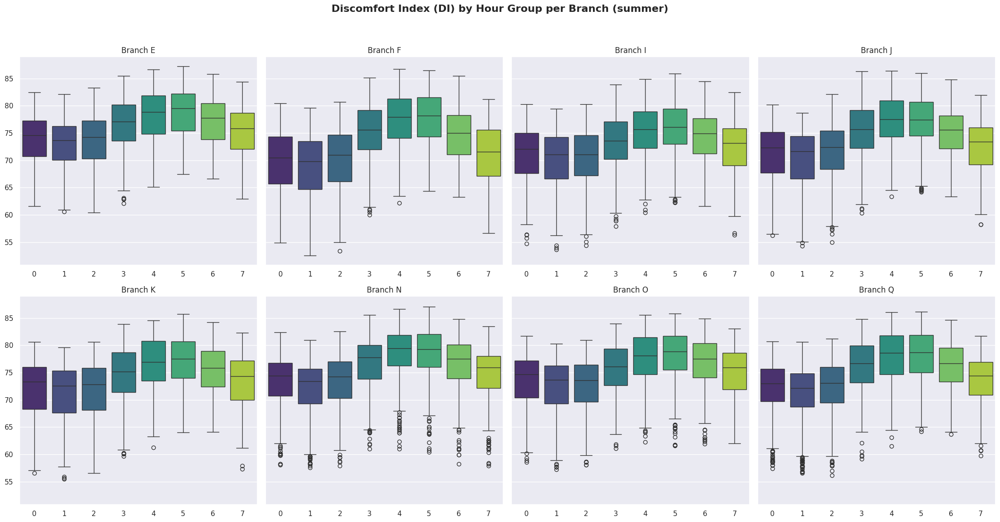

In [77]:
# 여름철 필터링
df_train_cluster0['month'] = pd.to_datetime(df_train_cluster0['tm']).dt.month
summer_df = df_train_cluster0[df_train_cluster0['month'].isin([6, 7, 8])]

# 지점 정렬
branches = sorted(summer_df['branch_id'].unique())
n_rows, n_cols = 2, 4

# subplot
import matplotlib.pyplot as plt
import seaborn as sns

fig, axes = plt.subplots(n_rows, n_cols, figsize=(22, 12), sharey=True)
axes = axes.flatten()

for i, branch in enumerate(branches):
    ax = axes[i]
    branch_df = summer_df[summer_df['branch_id'] == branch]
    sns.boxplot(data=branch_df, x='hour_group', y='DI', ax=ax, palette='viridis')
    ax.set_title(f'Branch {branch}', fontsize=12)
    ax.set_xlabel('')
    ax.set_ylabel('')

for j in range(len(branches), len(axes)):
    fig.delaxes(axes[j])

plt.suptitle('Discomfort Index (DI) by Hour Group per Branch (summer)', fontsize=16, fontweight='bold')
plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()

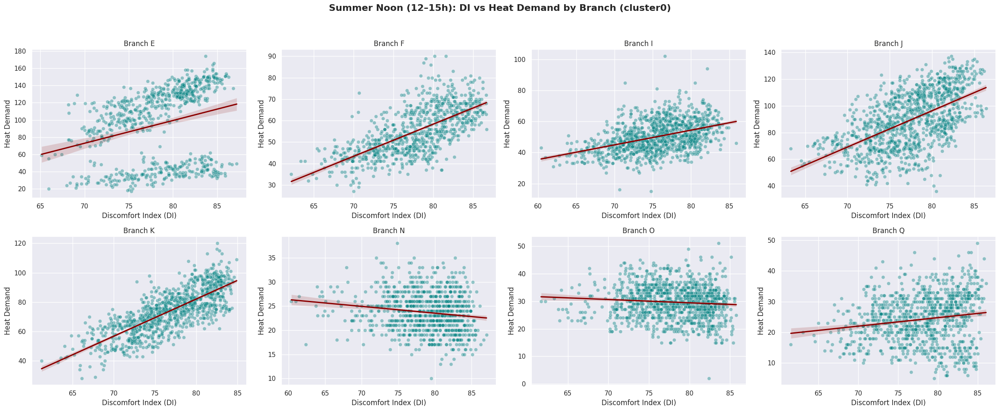

In [75]:
# DI 계산 (한 번만 실행하면 됨)
df_train_cluster0['DI'] = (
    0.81 * df_train_cluster0['ta'] +
    0.01 * df_train_cluster0['hm'] * (0.99 * df_train_cluster0['ta'] - 14.3) +
    46.3
)

# 필터링: 여름 낮 시간대 + 모든 지점
noon_df = df_train_cluster0[
    (df_train_cluster0['month'].isin([6, 7, 8])) &
    (df_train_cluster0['hour'].isin([12, 13, 14, 15]))
]

branches = sorted(noon_df['branch_id'].unique())

# 플롯
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(24, 10))
for i, branch in enumerate(branches):
    plt.subplot(2, 4, i+1)
    branch_df = noon_df[noon_df['branch_id'] == branch]

    sns.scatterplot(data=branch_df, x='DI', y='heat_demand', alpha=0.4, color='teal')
    sns.regplot(data=branch_df, x='DI', y='heat_demand', scatter=False, color='darkred')

    plt.title(f'Branch {branch}')
    plt.xlabel('Discomfort Index (DI)')
    plt.ylabel('Heat Demand')
    plt.grid(True)

plt.suptitle('Summer Noon (12–15h): DI vs Heat Demand by Branch (cluster0)', fontsize=16, fontweight='bold')
plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()

> E, J,K,F 등 열수요가 높았던 곳이 확실히 불쾌지수가 열수요와 상관관계가 있음을 확인할 수 있음

In [79]:
# 지점별 DI가 높을 때의 heat_demand 평균 비교
high_di_df = summer_df[summer_df['DI'] >= 75]
di_hd_mean = high_di_df.groupby('branch_id')['heat_demand'].mean().sort_values(ascending=False)
print(di_hd_mean)

branch_id
J    72.870698
E    68.269152
K    62.441104
F    52.644743
I    43.548374
O    24.866597
N    22.331157
Q    21.915296
Name: heat_demand, dtype: float64


In [80]:
# 불쾌지수 민감도 계수 비교 (DI → heat_demand 단순 선형 회귀계수)
from sklearn.linear_model import LinearRegression

coefs = {}
for b in summer_df['branch_id'].unique():
    sub = summer_df[(summer_df['branch_id'] == b) & (summer_df['DI'] >= 75)]
    if len(sub) > 0:
        model = LinearRegression()
        model.fit(sub[['DI']], sub['heat_demand'])
        coefs[b] = model.coef_[0]

print(sorted(coefs.items(), key=lambda x: -x[1]))

[('J', np.float64(7.0355465191767275)), ('E', np.float64(5.805991848974182)), ('K', np.float64(5.5241332628193565)), ('F', np.float64(2.7395179609548976)), ('I', np.float64(2.486099799489165)), ('Q', np.float64(0.9544794840415203)), ('O', np.float64(0.7751401377945303)), ('N', np.float64(0.3130773997538652))]


In [84]:
# 여름철만 필터링
summer_df = df_train_cluster0[df_train_cluster0['season'] == 'summer'].copy()

# 주요 지점 그룹과 나머지로 나누기
key_branches = ['K', 'E', 'J']
summer_df['group'] = summer_df['branch_id'].apply(lambda x: 'K/E/J' if x in key_branches else 'Other')

# 상관계수 계산 함수 정의
def compute_corrs(df):
    return pd.Series({
        'ta_corr': df['ta'].corr(df['heat_demand']),
        'hm_corr': df['hm'].corr(df['heat_demand']),
        'di_corr': df['DI'].corr(df['heat_demand']),
    })

# 그룹별 상관계수 계산
group_corrs = summer_df.groupby('group').apply(compute_corrs).reset_index()
print(group_corrs)

   group   ta_corr   hm_corr   di_corr
0  K/E/J  0.588307 -0.392907  0.533814
1  Other  0.244162 -0.320139  0.180810


=> 이제 K/E/J에서는 불쾌지수때문에 여름에 열수요가 높다고 생각해볼 수 있을 거 같음!

어떻게 고려할 수 있을까? 상호작용항을 생성하기 /'DI_effective' 변수 만들기

1. 삼중 상호작용 항 생성
2. 조건부 DI 변수 사용

In [172]:
df_train_cluster0_prac = df_train_cluster0.copy()

In [173]:
# 여름 여부 (boolean으로 만들기)
df_train_cluster0_prac['is_summer'] = (df_train_cluster0_prac['season'] == 'summer').astype(int)

# 주요 지점 여부
df_train_cluster0_prac['is_key_branch'] = df_train_cluster0_prac['branch_id'].apply(lambda x: 1 if x in ['K','E','J'] else 0)

# 삼중 상호작용항: 여름 & K/E/J & 불쾌지수
df_train_cluster0_prac['DI_interaction'] = df_train_cluster0_prac['DI'] * df_train_cluster0_prac['is_key_branch'] * summer_df['is_summer']

In [174]:
def assign_DI_effective(row):
    if (row['season'] == 'summer') and (row['branch_id'] in ['K','E','J']):
        return 1
    else:
        return 0

df_train_cluster0_prac['DI_effective'] = df_train_cluster0_prac.apply(assign_DI_effective, axis=1)

In [175]:
# 필요한 열만 선택 후 결측치 확인
cols_needed = ['ta', 'DI_interaction', 'heat_demand', 'DI_effective']
df_valid = df_train_cluster0_prac[cols_needed].dropna()

# 다시 모델 학습
import statsmodels.api as sm
X1 = sm.add_constant(df_valid[['ta', 'DI_interaction']])
y1 = df_valid['heat_demand']
model1 = sm.OLS(y1, X1).fit()

# 공통 변수 + 방식2
X2 = df_valid[['ta', 'DI_effective']]
y1 = df_valid['heat_demand']
model2 = sm.OLS(y1, X2).fit()

In [176]:
print("=== 방법 1: 상호작용항 ===")
print(model1.summary())

print("\n=== 방법 2: 조건부 변수 ===")
print(model2.summary())

=== 방법 1: 상호작용항 ===
                            OLS Regression Results                            
Dep. Variable:            heat_demand   R-squared:                       0.345
Model:                            OLS   Adj. R-squared:                  0.345
Method:                 Least Squares   F-statistic:                 1.204e+04
Date:                Thu, 12 Jun 2025   Prob (F-statistic):               0.00
Time:                        17:53:54   Log-Likelihood:            -2.0512e+05
No. Observations:               45786   AIC:                         4.103e+05
Df Residuals:                   45783   BIC:                         4.103e+05
Df Model:                           2                                         
Covariance Type:            nonrobust                                         
                     coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------
const            -26.788

=> interaction이 좀 더 높음

### **2) Feature 분석**


##### **(1) branch_id**

In [ ]:
df_train_cluster0.groupby('branch_id')['heat_demand'].describe()

,count,mean,std,min,25%,50%,75%,max
branch_id,,,,,,,,
E,26270.0,58.333689,40.510389,0.0,26.0,45.0,87.0,227.0
F,26278.0,67.806378,42.540855,1.0,37.0,54.0,93.0,257.0
I,26279.0,77.364664,56.433210,2.0,36.0,53.0,112.0,275.0
J,26277.0,85.767515,54.627913,1.0,46.0,71.0,118.0,295.0
K,26278.0,52.653018,29.387538,0.0,28.0,47.0,73.0,171.0
N,26279.0,84.274820,72.145200,3.0,27.0,53.0,129.0,365.0
O,26278.0,71.502816,57.704600,2.0,27.0,45.0,109.0,317.0
Q,26279.0,55.578294,45.094550,0.0,22.0,37.0,83.0,286.0


* 지사별 열수요 분포

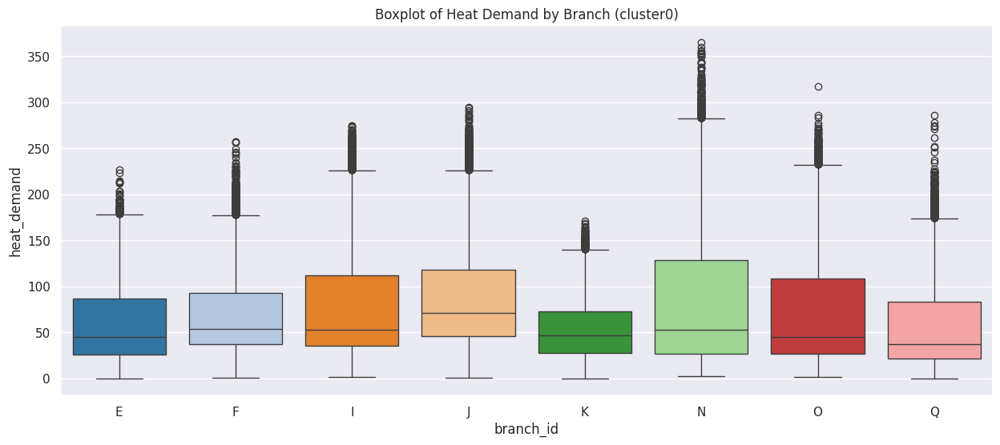

In [ ]:
plt.figure(figsize=(15,6))
sns.boxplot(x='branch_id', y='heat_demand', data=df_train_cluster0, palette='tab20')
plt.title('Boxplot of Heat Demand by Branch (cluster0)')
plt.show()


* 브랜치별 시간에 따른 평균 열수요

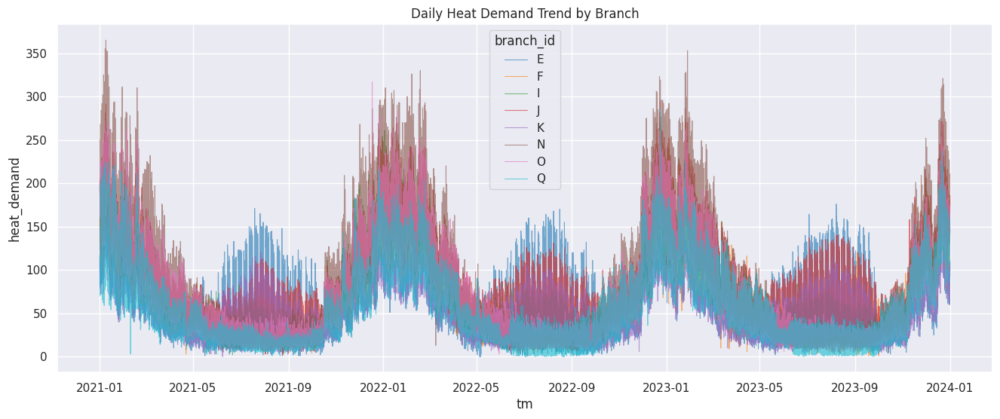

In [ ]:
#브랜치별 시간에 따른 평균 열수요
daily_branch_avg = df_train_cluster0.groupby(['tm', 'branch_id'])['heat_demand'].mean().reset_index()
plt.figure(figsize=(16,6))
palette = {
    'E': '#1f77b4',  # 파랑
    'F': '#ff7f0e',  # 주황
    'I': '#2ca02c',  # 녹색
    'J': '#d62728',  # 빨강
    'K': '#9467bd',  # 보라
    'N': '#8c564b',  # 갈색
    'O': '#e377c2',  # 핑크
    'Q': '#17becf',  # 시안 (회색 대신)
}
sns.lineplot(data=daily_branch_avg, x='tm', y='heat_demand', hue='branch_id', linewidth=0.8, alpha=0.6, palette=palette)
plt.title('Daily Heat Demand Trend by Branch')
plt.show()

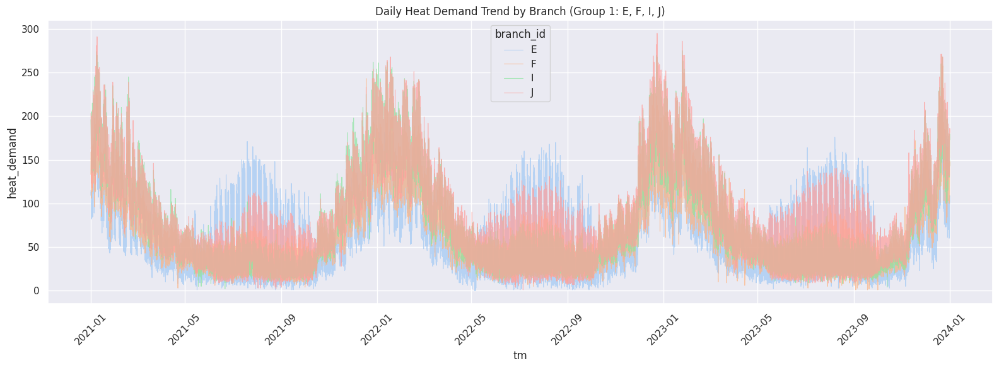

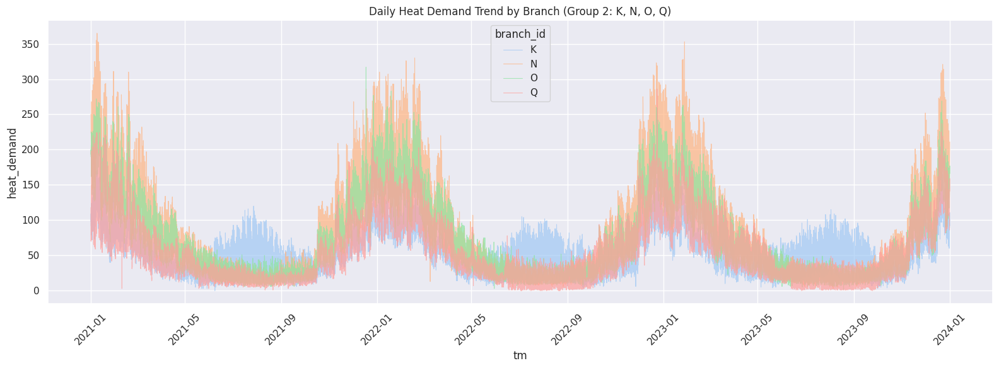

In [46]:
# 브랜치 리스트 나누기
group1 = ['E', 'F', 'I', 'J']
group2 = ['K', 'N', 'O', 'Q']

# 시간 순 정렬
df_train_cluster0['tm'] = pd.to_datetime(df_train_cluster0['tm'])

# 일별 브랜치 평균
daily_branch_avg = df_train_cluster0.groupby(['tm', 'branch_id'])['heat_demand'].mean().reset_index()

# 첫 번째 그룹
plt.figure(figsize=(16, 6))
sns.lineplot(data=daily_branch_avg[daily_branch_avg['branch_id'].isin(group1)],
             x='tm', y='heat_demand', hue='branch_id', linewidth=0.8, alpha=0.7)
plt.title('Daily Heat Demand Trend by Branch (Group 1: E, F, I, J)')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

# 두 번째 그룹
plt.figure(figsize=(16, 6))
sns.lineplot(data=daily_branch_avg[daily_branch_avg['branch_id'].isin(group2)],
             x='tm', y='heat_demand', hue='branch_id',linewidth=0.8, alpha=0.7)
plt.title('Daily Heat Demand Trend by Branch (Group 2: K, N, O, Q)')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


* 브랜치별 열수요 상관관계 heatmap

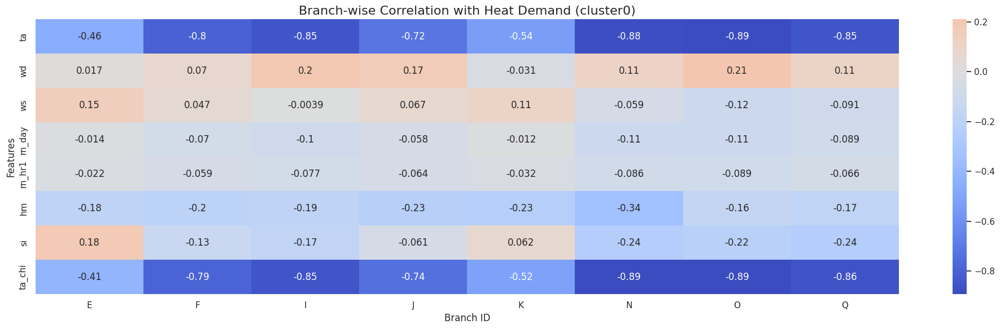

In [ ]:
numeric_features = ['ta', 'wd', 'ws', 'rn_day', 'rn_hr1', 'hm', 'si', 'ta_chi']

corr_list = []
branch_ids = df_train_cluster0['branch_id'].unique()

for b in branch_ids:
    df_branch = df_train_cluster0[df_train_cluster0['branch_id'] == b]
    corr = df_branch[numeric_features + ['heat_demand']].corr()['heat_demand'].drop('heat_demand')
    corr_list.append(corr)

# 데이터프레임 형태로 변환
corr_df = pd.concat(corr_list, axis=1)
corr_df.columns = branch_ids

# 시각화
plt.figure(figsize=(20, 6))
sns.heatmap(corr_df, cmap='coolwarm', center=0, annot=True)
plt.title('Branch-wise Correlation with Heat Demand (cluster0)', fontsize=16)
plt.xlabel('Branch ID')
plt.ylabel('Features')
plt.tight_layout()
plt.show()

* 이상치 확인 => 한파로 연결

In [ ]:
# 전체 기온별 평균 및 표준편차 계산
ta_stats = df_train_cluster0.groupby('ta')['heat_demand'].agg(['mean', 'std']).reset_index()
ta_stats.rename(columns={'mean': 'overall_mean', 'std': 'overall_std'}, inplace=True)

# 원본 데이터와 병합
df_with_stats = pd.merge(df_train_cluster0, ta_stats, on='ta')

# z-score 계산
df_with_stats['z_score'] = (df_with_stats['heat_demand'] - df_with_stats['overall_mean']) / df_with_stats['overall_std']

# 이상값 추출 (z > 2.5)
outliers = df_with_stats[df_with_stats['z_score'] > 2.5].sort_values('z_score', ascending=False)

# 결과 출력
print(outliers[['tm', 'ta', 'branch_id', 'heat_demand', 'z_score']])


In [114]:
# 그룹별 평균 열수요 계산
grouped = df_train_cluster0.groupby(['ta', 'branch_id'])['heat_demand'].mean().reset_index()

# 전체 기온별 평균 및 표준편차 계산
ta_stats = df_train_cluster0.groupby('ta')['heat_demand'].agg(['mean', 'std']).reset_index()
ta_stats.rename(columns={'mean': 'overall_mean', 'std': 'overall_std'}, inplace=True)

# 병합 후 z-score 계산
merged = pd.merge(grouped, ta_stats, on='ta')
merged['z_score'] = (merged['heat_demand'] - merged['overall_mean']) / merged['overall_std']

# 이상값 필터링
outliers = merged[merged['z_score'] > 2.5]

# (ta, branch_id) 튜플 추출
outlier_keys = [tuple(x) for x in outliers[['ta', 'branch_id']].to_numpy()]

# 원본 데이터에서 해당 그룹의 tm, heat_demand, z_score 포함 추출
matching = df_train_cluster0[df_train_cluster0[['ta', 'branch_id']].apply(tuple, axis=1).isin(outlier_keys)]

# z_score 붙이기
matching = matching.merge(outliers[['ta', 'branch_id', 'z_score']], on=['ta', 'branch_id'], how='left')

# 정렬 및 출력
print(matching[['tm', 'ta', 'branch_id', 'heat_demand', 'z_score']].sort_values(['z_score'], ascending=False))

                    tm    ta branch_id  heat_demand   z_score
7  2021-01-08 23:00:00 -10.6         N        343.0  4.218025
3  2021-01-07 21:00:00 -12.1         N        355.0  4.184410
6  2021-01-08 22:00:00 -10.3         N        356.0  4.010514
4  2021-01-07 22:00:00 -12.5         N        354.0  3.860738
2  2021-01-07 20:00:00 -11.6         N        350.0  3.232957
14 2023-01-24 21:00:00 -11.6         N        320.0  3.232957
13 2023-01-24 20:00:00 -11.4         N        327.0  3.054555
8  2021-01-09 00:00:00 -11.4         N        323.0  3.054555
1  2021-01-07 18:00:00 -10.5         N        293.0  2.964213
0  2021-12-25 21:00:00 -13.3         I        242.0  2.895063
10 2021-01-09 03:00:00 -11.8         N        290.0  2.818205
11 2021-01-09 06:00:00 -12.4         N        280.0  2.739580
15 2023-01-24 23:00:00 -11.9         N        316.0  2.700099
12 2021-01-09 08:00:00 -11.9         N        287.0  2.700099
5  2021-01-08 10:00:00 -11.1         N        256.0  2.694772
9  2021-

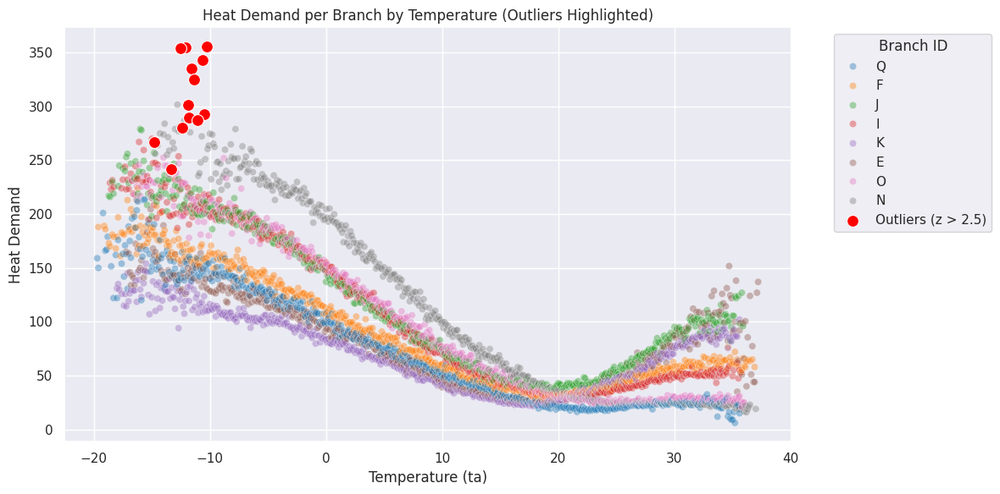

In [108]:
plt.figure(figsize=(12, 6))

# 전체 지점 데이터 산점도 (지점별 색상 구분)
sns.scatterplot(data=merged, x='ta', y='heat_demand', hue='branch_id',
                palette='tab10', alpha=0.4, legend='full')

# 이상값만 빨간 점으로 표시
sns.scatterplot(data=outliers, x='ta', y='heat_demand',
                color='red', s=100, label='Outliers (z > 2.5)')

plt.title('Heat Demand per Branch by Temperature (Outliers Highlighted)')
plt.xlabel('Temperature (ta)')
plt.ylabel('Heat Demand')
plt.legend(title='Branch ID', bbox_to_anchor=(1.05, 1), loc='upper left')  # 범례 위치 조정
plt.grid(True)
plt.tight_layout()
plt.show()

> N : ta = -12 ~ -10도 근처에서 heat_demand가 300~350 이상까지 올라가는 극단적 수요 발생, 다른 지점은 같은 온도에서 보통 200 이하 수준에 머물고 있음,


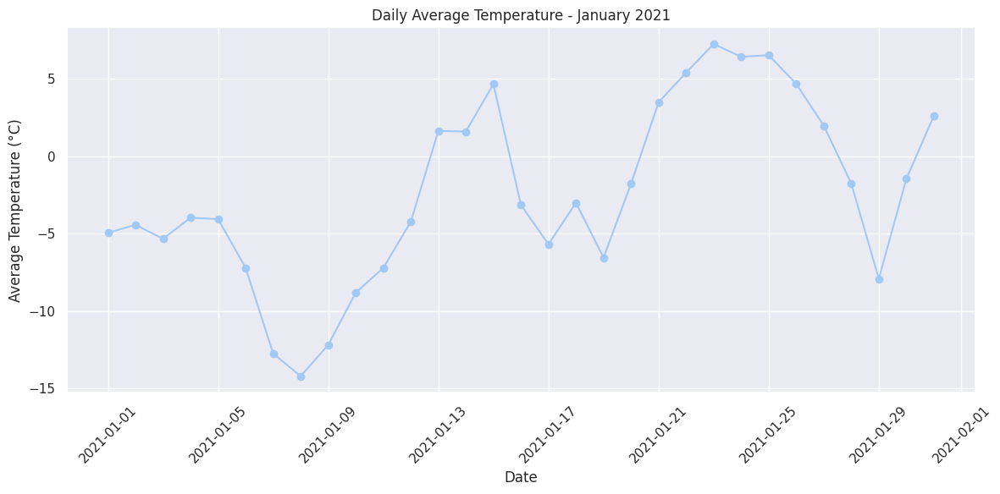

In [116]:
# 2021년 1월 데이터 필터링
df_train_cluster0['tm'] = pd.to_datetime(df_train_cluster0['tm'])
jan_2021 = df_train_cluster0[(df_train_cluster0['tm'].dt.year == 2021) & (df_train_cluster0['tm'].dt.month == 1)]

# 날짜별 평균 기온 계산
daily_temp = jan_2021.groupby(jan_2021['tm'].dt.date)['ta'].mean().reset_index()
daily_temp.columns = ['date', 'avg_ta']

# 그래프 그리기
import matplotlib.pyplot as plt

plt.figure(figsize=(12, 6))
plt.plot(daily_temp['date'], daily_temp['avg_ta'], marker='o')
plt.title('Daily Average Temperature - January 2021')
plt.xlabel('Date')
plt.ylabel('Average Temperature (°C)')
plt.xticks(rotation=45)
plt.grid(True)
plt.tight_layout()
plt.show()


> 뉴스에 검색해보니 2021년 1월 7~9일, 2023-01-24은 기록적인 한파였다고 함! 이상치 아니고, 기록적인 한파인 경우 열수요가 급증하는 것으로 보임

In [177]:
# 겨울 데이터 필터링
winter_df = df_train_cluster0[df_train_cluster0['season'] == 'winter']

# 겨울 동안 지점별 평균 열수요 계산
winter_demand_by_branch = (
    winter_df.groupby('branch_id')['heat_demand']
    .mean().reset_index()
    .rename(columns={'heat_demand': 'avg_heat_demand_winter'})
)

# 기록적 한파 기간 포함 데이터 필터링
cold_dates = pd.to_datetime(['2021-01-07', '2021-01-08', '2021-01-09', '2023-01-24'])
cold_df = df_train_cluster0[df_train_cluster0['tm'].dt.date.isin(cold_dates.date)]

# 한파 기간 지점별 평균 열수요 계산
cold_demand_by_branch = (
    cold_df.groupby('branch_id')['heat_demand']
    .mean().reset_index()
    .rename(columns={'heat_demand': 'avg_heat_demand_cold'})
)

# 병합 후 겨울 평균 대비 증감 비율 계산
comparison = pd.merge(winter_demand_by_branch, cold_demand_by_branch, on='branch_id', how='left')
comparison['increase_ratio'] = comparison['avg_heat_demand_cold'] / comparison['avg_heat_demand_winter']

# 결과 출력
print(comparison.sort_values('increase_ratio', ascending=False))


  branch_id  avg_heat_demand_winter  avg_heat_demand_cold  increase_ratio
0         E              100.536966            148.645833        1.478519
4         K               89.006174            129.000000        1.449338
5         N              185.799506            265.604167        1.429520
6         O              153.993518            216.739583        1.407459
2         I              158.663065            220.708333        1.391050
1         F              127.573391            175.031250        1.372004
3         J              160.618768            220.010417        1.369768
7         Q              116.402068            157.708333        1.354859


> 모든 지점에서 기록적 한파 시기(2021-01-07~09, 2023-01-24)에 열수요가 전체 평균 대비 1.4배 수준으로 급증하였습니다.
> N 지점의 2021년 1월 이상치로 보였던 고수요가 실제 이상치가 아닌 '기록적 한파에 따른 급증 현상'임을 의미합니다.

한파주의보의 발효조건은 다음과 같다.

① 아침 최저기온이 전날보다 10도 이상 내려가 3도 이하이고 평년값보다 3도 낮을 것으로 예상 될 때.


② 아침 최저기온이 -12도 이하가 이틀 이상 지속될 것으로 예상 되는 경우


③ 급격하게 온도가 떨어지는 현상으로 중대한 피해가 예상될 경우

필요한거 : 아침 최저 기온, 평년값

일반적으로 6시~9시의 기온 중 가장 낮은 값을 아침 최저 기온으로 간주

우리는 아침 최저기온 = 06~09시 사이의 최저 ta 이렇게해야할듯

In [161]:
# 1. 날짜 및 시간 파생
df_train_cluster0_prac['date'] = df_train_cluster0_prac['tm'].dt.date
df_train_cluster0_prac['month_day'] = df_train_cluster0_prac['tm'].dt.strftime('%m-%d')
df_train_cluster0_prac['hour'] = df_train_cluster0_prac['tm'].dt.hour

In [162]:
# 1. 아침 시간 필터링 (06~09시)
morning_df = df_train_cluster0_prac[df_train_cluster0_prac['tm'].dt.hour.between(6, 9)]

# 2. 날짜별 아침 최저기온 계산
daily_min_temp = (
    morning_df
    .groupby(['branch_id', morning_df['tm'].dt.date])['ta']
    .min()
    .reset_index()
    .rename(columns={'tm': 'date', 'ta': 'min_morning_ta'})
)

# 3. 월-일 기준 평년 아침 최저기온 계산 (지점별)
daily_min_temp['month_day'] = pd.to_datetime(daily_min_temp['date']).dt.strftime('%m-%d')
normal_temp = (
    daily_min_temp
    .groupby(['branch_id', 'month_day'])['min_morning_ta']
    .mean()
    .reset_index()
    .rename(columns={'min_morning_ta': 'normal_morning_min_ta'})
)

# 4. 평년값 merge
daily_min_temp = daily_min_temp.merge(normal_temp, on=['branch_id', 'month_day'], how='left')

# 5. 전날 아침 최저기온 merge
daily_min_temp['prev_ta'] = (
    daily_min_temp
    .sort_values(['branch_id', 'date'])
    .groupby('branch_id')['min_morning_ta']
    .shift(1)
)

# 6. 하강폭 계산
daily_min_temp['ta_drop'] = daily_min_temp['prev_ta'] - daily_min_temp['min_morning_ta']

# 7. 조건 ①: 전날보다 10℃ 이상↓ & 3℃ 이하 & 평년보다 3℃↓
daily_min_temp['cold_wave_flag_1'] = (
    (daily_min_temp['ta_drop'] >= 10) &
    (daily_min_temp['min_morning_ta'] <= 3) &
    (daily_min_temp['min_morning_ta'] <= daily_min_temp['normal_morning_min_ta'] - 3)
).astype(int)

# 8. 조건 ②: -12℃ 이하 이틀 연속
daily_min_temp['below_minus12'] = (daily_min_temp['min_morning_ta'] <= -12).astype(int)
daily_min_temp['below_minus12_prev'] = (
    daily_min_temp
    .sort_values(['branch_id', 'date'])
    .groupby('branch_id')['below_minus12']
    .shift(1)
)
daily_min_temp['cold_wave_flag_2'] = (
    (daily_min_temp['below_minus12'] == 1) &
    (daily_min_temp['below_minus12_prev'] == 1)
).astype(int)

# 9. 최종 한파 플래그
daily_min_temp['cold_wave_flag'] = (
    (daily_min_temp['cold_wave_flag_1'] == 1) |
    (daily_min_temp['cold_wave_flag_2'] == 1)
).astype(int)


In [179]:
daily_min_temp[daily_min_temp['cold_wave_flag']==1]

,branch_id,date,min_morning_ta,month_day,normal_morning_min_ta,prev_ta,ta_drop,cold_wave_flag_1,below_minus12,below_minus12_prev,cold_wave_flag_2,cold_wave_flag
7,E,2021-01-08,-17.2,01-08,-8.700000,-15.9,1.3,0,1,1.0,1,1
8,E,2021-01-09,-16.7,01-09,-4.100000,-17.2,-0.5,0,1,1.0,1,1
9,E,2021-01-10,-14.6,01-10,-7.133333,-16.7,-2.1,0,1,1.0,1,1
360,E,2021-12-27,-12.3,12-27,-8.400000,-13.9,-1.6,0,1,1.0,1,1
712,E,2022-12-14,-9.7,12-14,-0.500000,2.5,12.2,1,0,0.0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...
8496,Q,2023-04-12,1.7,04-12,9.400000,14.2,12.5,1,0,0.0,0,1
8745,Q,2023-12-17,-12.6,12-17,-8.800000,-2.5,10.1,1,1,0.0,0,1
8746,Q,2023-12-18,-13.0,12-18,-13.600000,-12.6,0.4,0,1,1.0,1,1
8750,Q,2023-12-22,-14.8,12-22,-9.933333,-14.3,0.5,0,1,1.0,1,1


In [164]:
# 1. 이상 열수요 시점 가져오기 (날짜 단위로)
outlier_dates = pd.to_datetime(matching['tm']).dt.date.unique()

# 2. 한파 플래그가 1인 날짜 추출
cold_wave_dates = daily_min_temp[daily_min_temp['cold_wave_flag'] == 1]['date'].unique()

# 3. 겹치는 날짜 확인
common_dates = sorted(set(outlier_dates) & set(pd.to_datetime(cold_wave_dates).date))

print("이상 열수요 날짜 중 한파 날짜와 겹치는 날:")
for d in common_dates:
    print(d)

이상 열수요 날짜 중 한파 날짜와 겹치는 날:
2021-01-07
2021-01-08
2021-01-09
2021-12-25
2023-01-24
2023-01-25


In [165]:
# cold_wave_dates를 datetime 형으로 변환 후 정렬
cold_wave_dates_sorted = sorted(pd.to_datetime(cold_wave_dates))

# 출력
for d in cold_wave_dates_sorted:
    print(d.date())  # 또는 그냥 print(d) 원하면 시간 포함

2021-01-02
2021-01-03
2021-01-04
2021-01-07
2021-01-08
2021-01-09
2021-01-10
2021-01-11
2021-01-12
2021-01-19
2021-01-20
2021-04-14
2021-10-17
2021-12-13
2021-12-25
2021-12-26
2021-12-27
2021-12-28
2022-01-18
2022-01-21
2022-02-07
2022-02-24
2022-11-30
2022-12-14
2022-12-19
2022-12-20
2022-12-24
2022-12-25
2022-12-26
2022-12-27
2023-01-24
2023-01-25
2023-01-28
2023-01-29
2023-03-13
2023-03-16
2023-04-12
2023-11-24
2023-12-17
2023-12-18
2023-12-22
2023-12-23


### **4) lag 변수**


<Figure size 1000x400 with 0 Axes>

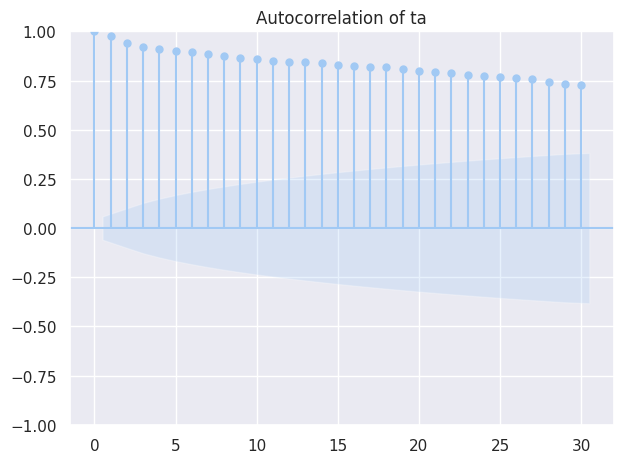

<Figure size 1000x400 with 0 Axes>

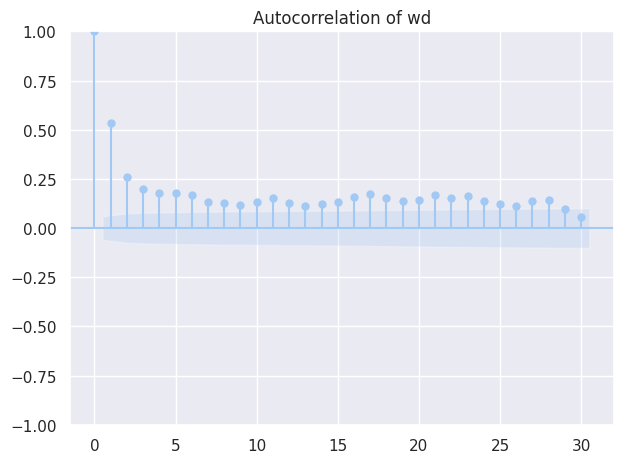

<Figure size 1000x400 with 0 Axes>

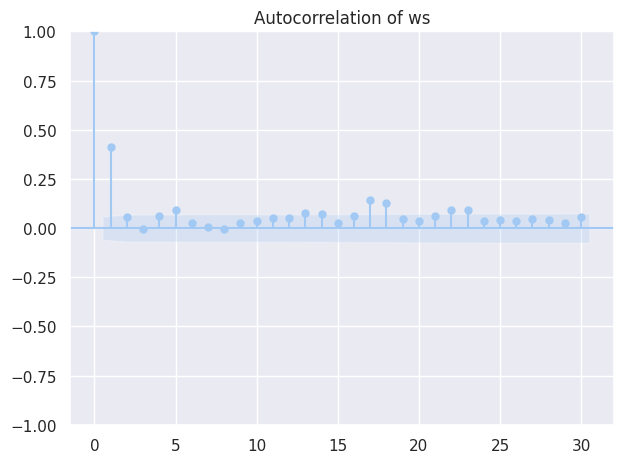

<Figure size 1000x400 with 0 Axes>

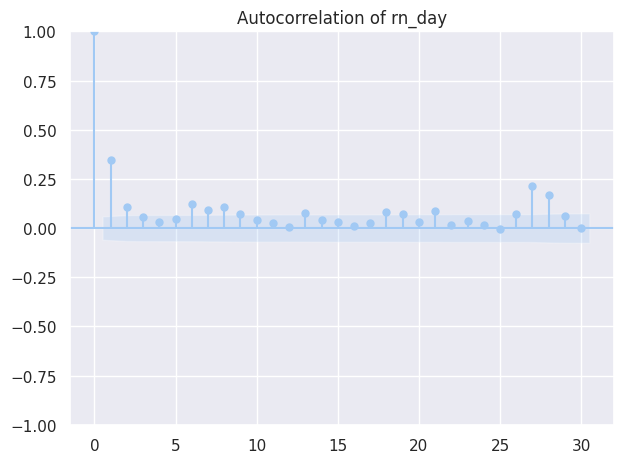

<Figure size 1000x400 with 0 Axes>

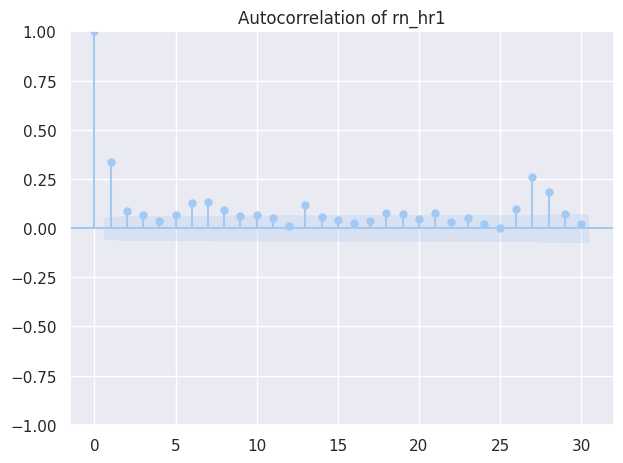

<Figure size 1000x400 with 0 Axes>

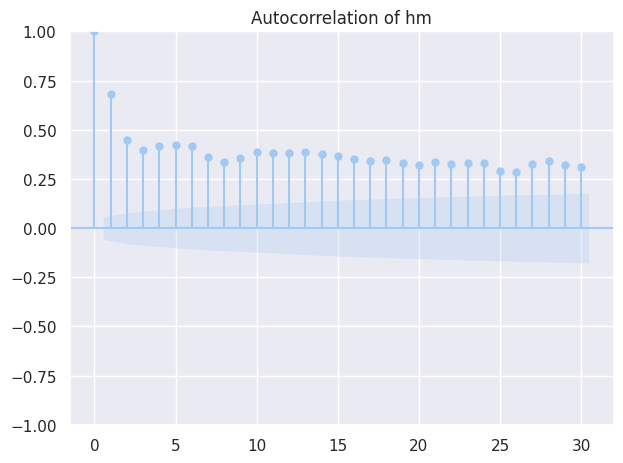

<Figure size 1000x400 with 0 Axes>

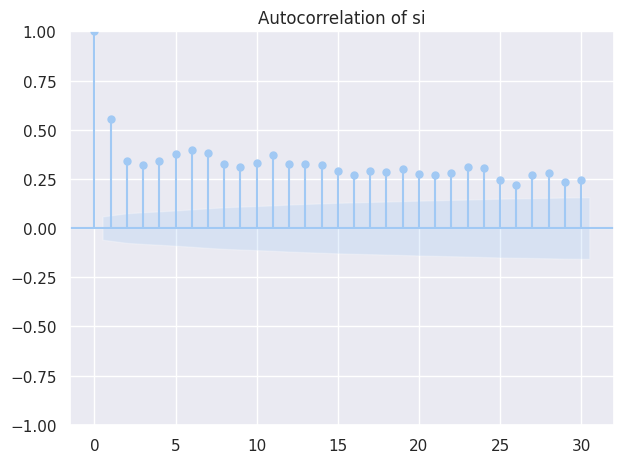

<Figure size 1000x400 with 0 Axes>

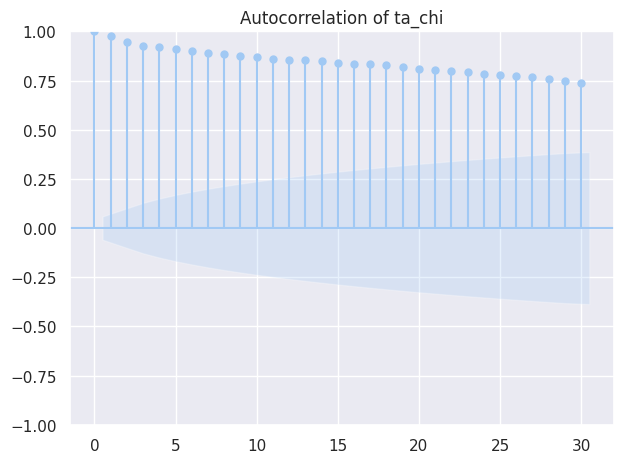

<Figure size 1000x400 with 0 Axes>

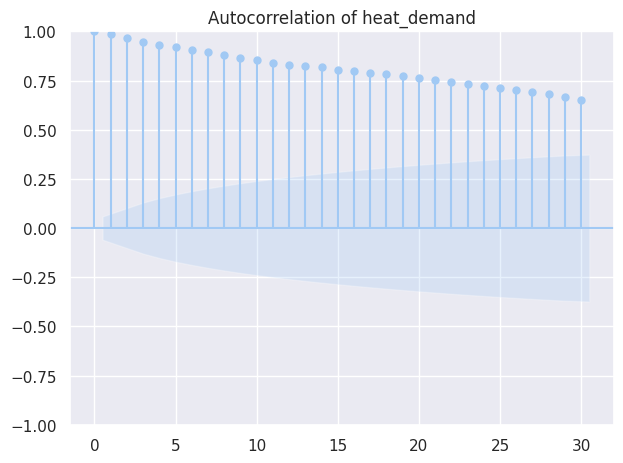

<Figure size 1000x400 with 0 Axes>

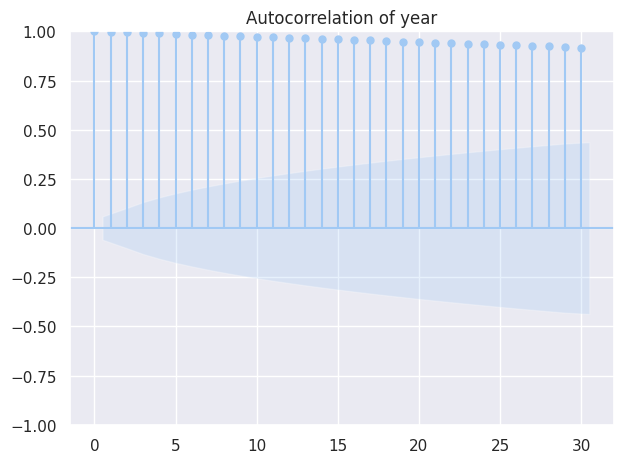

<Figure size 1000x400 with 0 Axes>

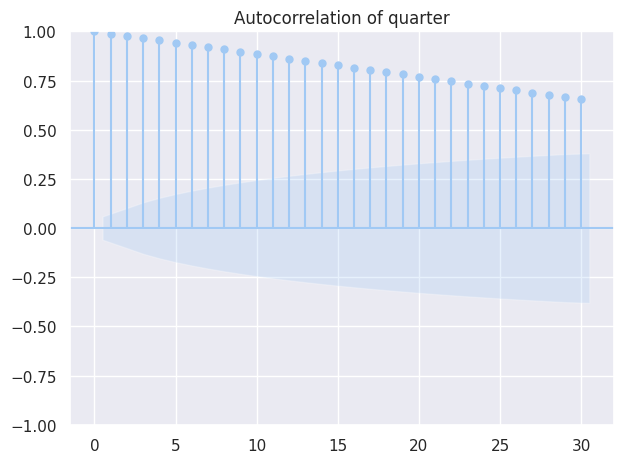

<Figure size 1000x400 with 0 Axes>

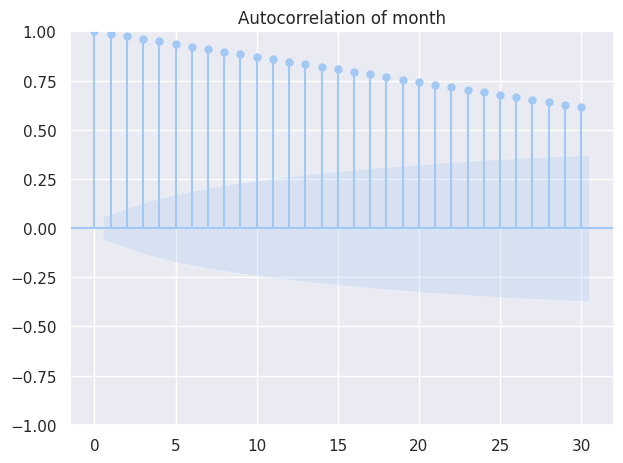

<Figure size 1000x400 with 0 Axes>

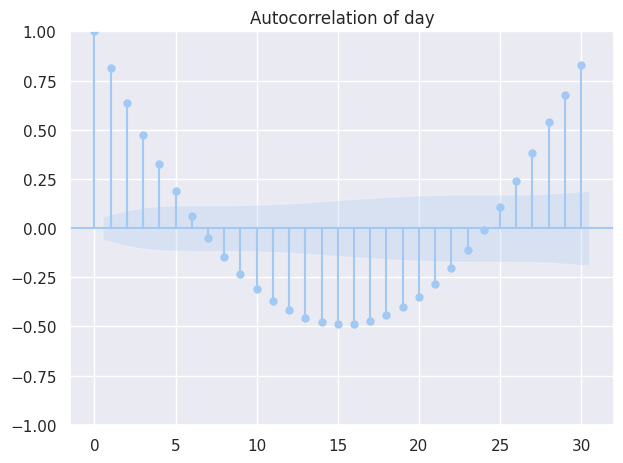

<Figure size 1000x400 with 0 Axes>

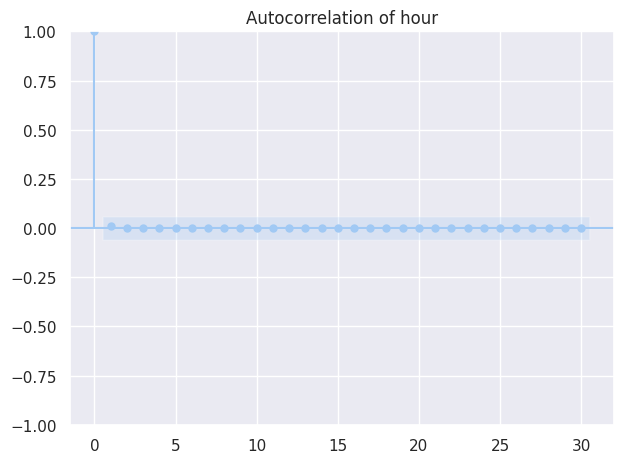

<Figure size 1000x400 with 0 Axes>

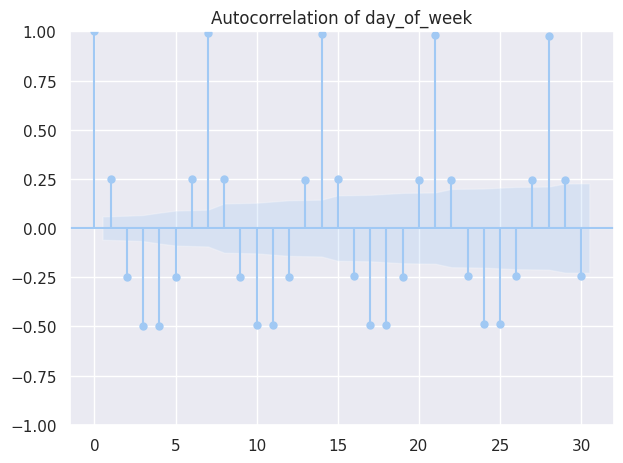

<Figure size 1000x400 with 0 Axes>

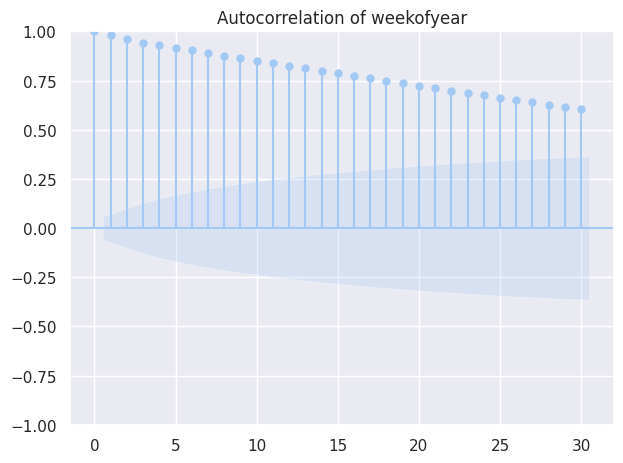

<Figure size 1000x400 with 0 Axes>

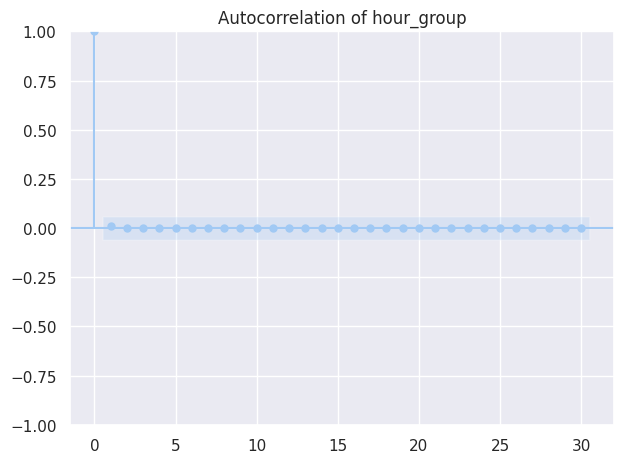

<Figure size 1000x400 with 0 Axes>

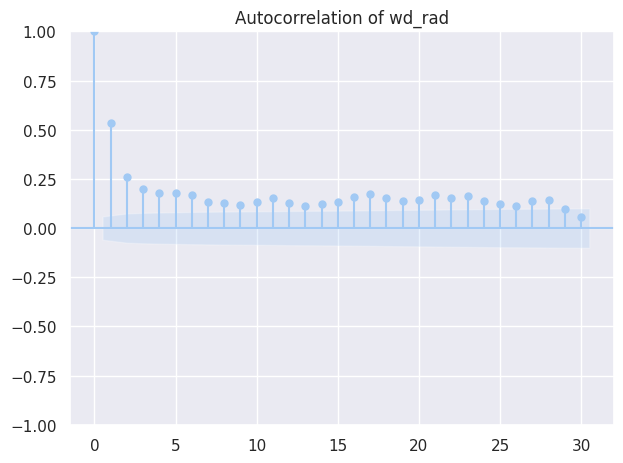

<Figure size 1000x400 with 0 Axes>

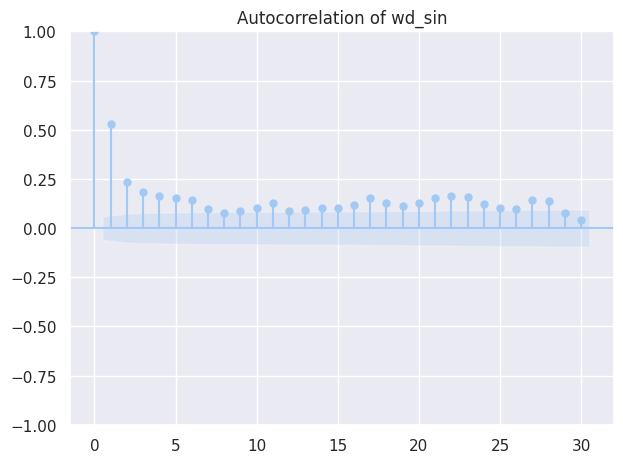

<Figure size 1000x400 with 0 Axes>

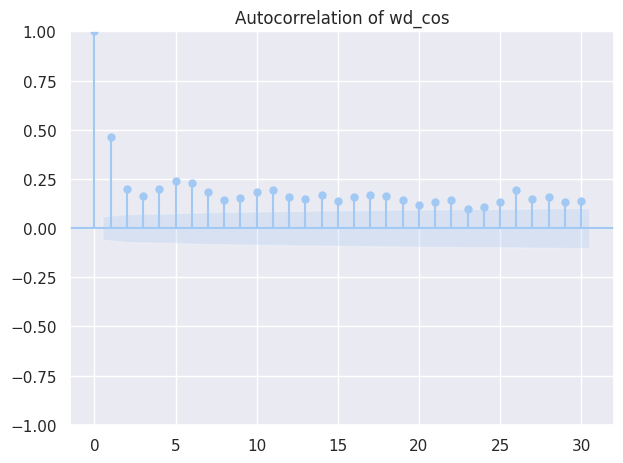

<Figure size 1000x400 with 0 Axes>

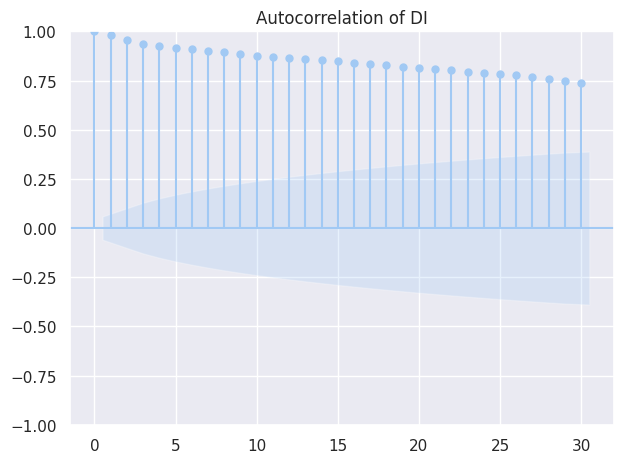

In [166]:
#lag변수

from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
import matplotlib.pyplot as plt

# 일자별 평균값 사용
daily_df = df_train_cluster0.copy()
daily_df['tm'] = pd.to_datetime(daily_df['tm'])
daily_df['date'] = daily_df['tm'].dt.date
numeric_cols = df_train_cluster0.select_dtypes(include='number').columns

daily_mean = daily_df.groupby('date')[numeric_cols].mean()

# 변수별 ACF 시각화
for col in numeric_cols:
    if col == 'cluster':
        continue

    plt.figure(figsize=(10, 4))
    plot_acf(daily_mean[col], lags=30, alpha=0.05)  # 최대 30일 lag까지
    plt.title(f"Autocorrelation of {col}")
    plt.grid(True)
    plt.tight_layout()
    plt.show()

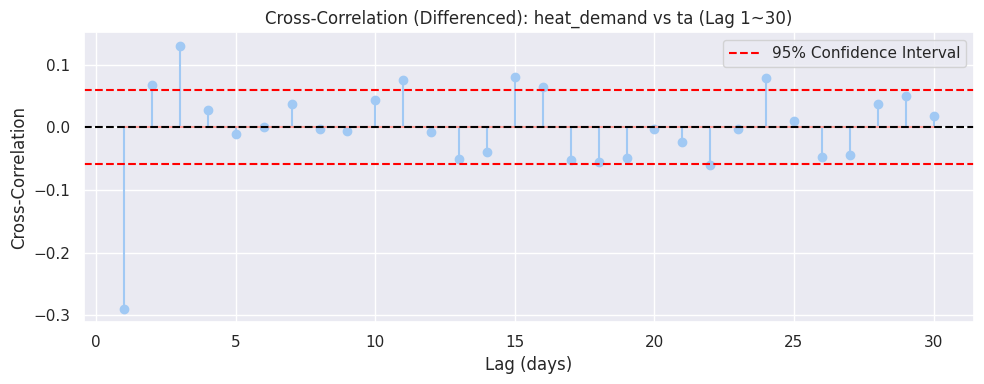

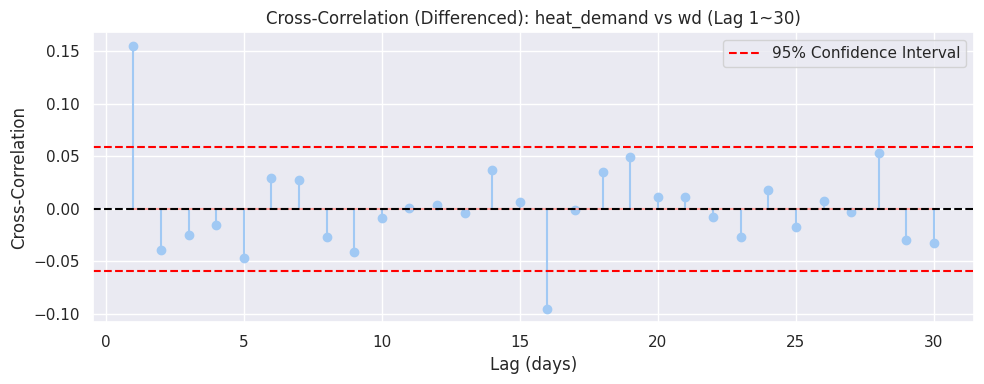

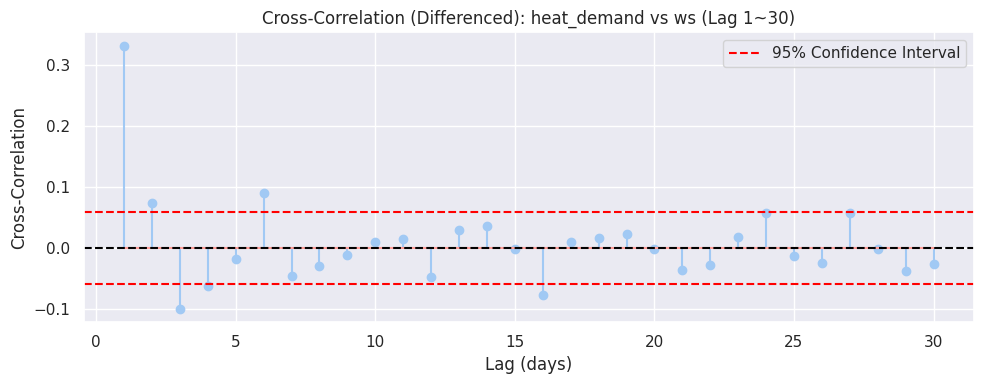

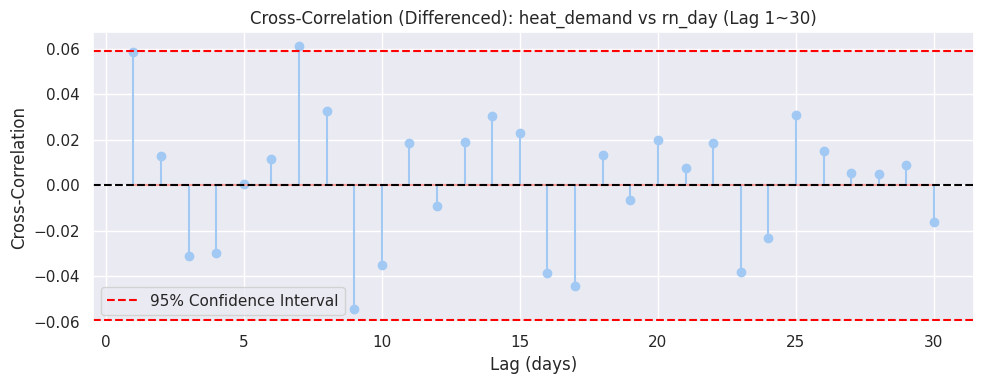

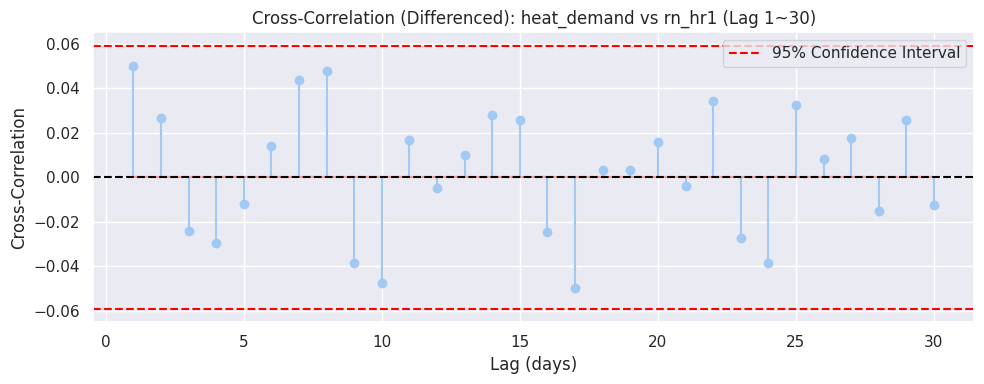

...

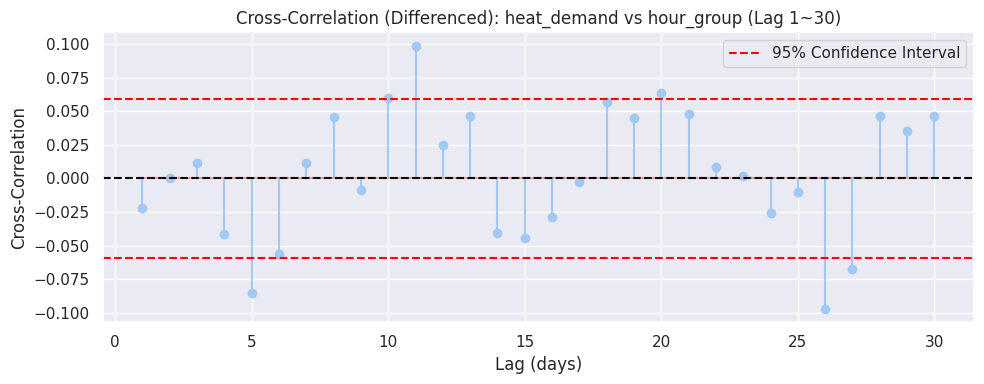

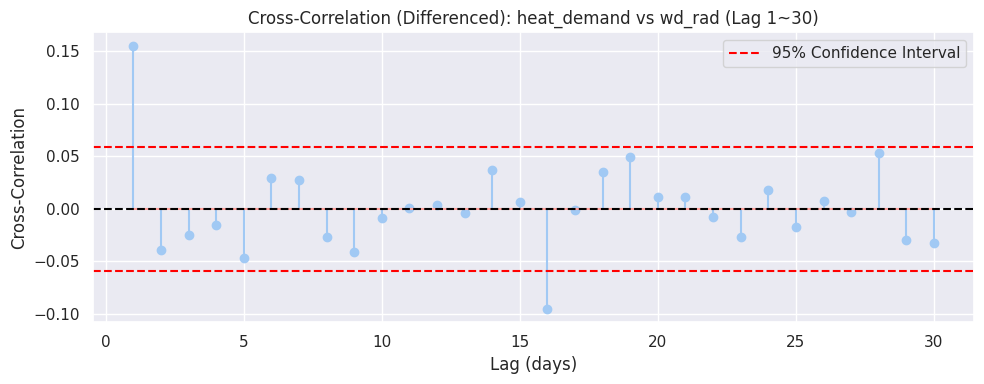

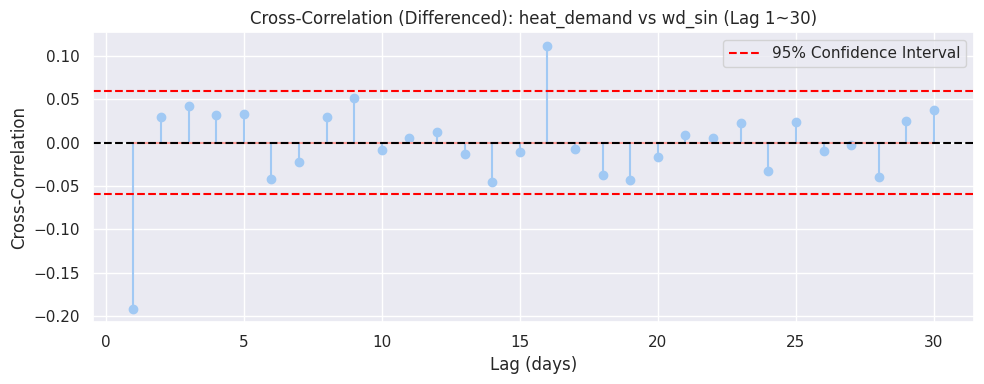

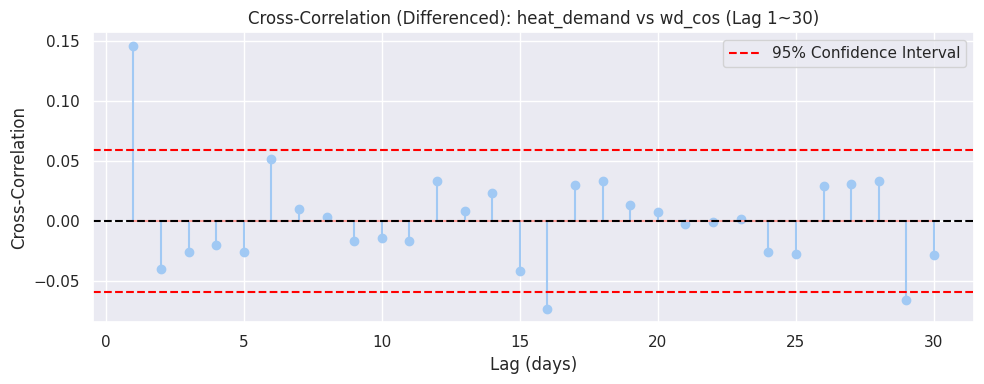

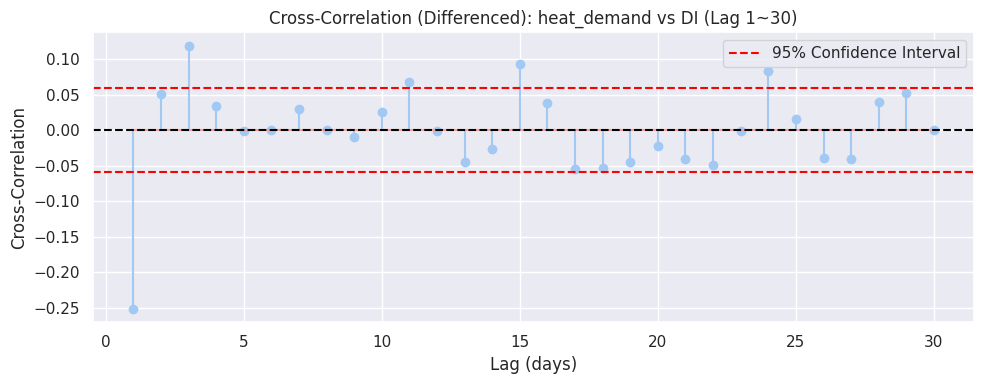

In [182]:
from statsmodels.tsa.stattools import ccf
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

# 날짜 처리 및 일별 평균
df_train_cluster0['tm'] = pd.to_datetime(df_train_cluster0['tm'])
df_train_cluster0['date'] = df_train_cluster0['tm'].dt.date

# 숫자형 변수만 선택
numeric_cols = df_train_cluster0.select_dtypes(include=[np.number]).columns

# 숫자형 변수만 일별 평균
daily_df = df_train_cluster0.groupby('date')[numeric_cols].mean()

target_var = 'heat_demand'
variables = [col for col in daily_df.columns if col != target_var]

# target_var 1차 차분
target_diff = daily_df[target_var].diff().dropna()
max_lag = 30

for var in variables:
    var_diff = daily_df[var].diff().dropna()

    min_len = min(len(target_diff), len(var_diff))
    x = target_diff[:min_len]
    y = var_diff[:min_len]

    # CCF 계산 (lag 0 제외, lag 1~30만 사용)
    ccf_vals_full = ccf(x, y)
    ccf_vals = ccf_vals_full[1:max_lag + 1]  # lag=1~30
    lags_range = np.arange(1, max_lag + 1)

    # 신뢰구간
    N = len(x)
    conf_level = 1.96 / np.sqrt(N)

    plt.figure(figsize=(10, 4))
    plt.stem(lags_range, ccf_vals)
    plt.title(f"Cross-Correlation (Differenced): {target_var} vs {var} (Lag 1~{max_lag})")
    plt.xlabel("Lag (days)")
    plt.ylabel("Cross-Correlation")
    plt.grid(True)
    plt.axhline(0, color='black', linestyle='--')
    plt.axhline(conf_level, color='red', linestyle='--', label='95% Confidence Interval')
    plt.axhline(-conf_level, color='red', linestyle='--')
    plt.legend()
    plt.tight_layout()
    plt.show()
